# Mafe scRNA-seq

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob
from pathlib import Path
import requests
import itertools
import re
import sys
from  matplotlib.ticker import PercentFormatter
import scanpy as sc
import anndata as ad
import cello
from statannot import add_stat_annotation
from statannotations.Annotator import Annotator

# if IN_COLAB:
#     %matplotlib inline
%matplotlib inline
show_plot = True

/Users/senosam/opt/anaconda3/lib/python3.7/site-packages/numba/core/errors.py:149: UserWarning: Insufficiently recent colorama version found. Numba requires colorama >= 0.3.9
  warnings.warn(msg)


In [2]:
# Convenient IPython console
# comment it if you execute Jupyterlab on a remote server
# %qtconsole --style monokai
# and use instead
%connect_info
# then jupyter qtconsole --style monokai --existing ./kernel.json
# or if remote: jupyter qtconsole --style monokai --existing ./kernel.json --ssh alexis@CRCT2112

{
  "shell_port": 51861,
  "iopub_port": 51862,
  "stdin_port": 51863,
  "control_port": 51865,
  "hb_port": 51864,
  "ip": "127.0.0.1",
  "key": "1cd53d04-da0247ac1444764e092402bc",
  "transport": "tcp",
  "signature_scheme": "hmac-sha256",
  "kernel_name": ""
}

Paste the above JSON into a file, and connect with:
    $> jupyter <app> --existing <file>
or, if you are local, you can connect with just:
    $> jupyter <app> --existing kernel-209ec8c7-3602-4636-89ab-c61734c4cb93.json
or even just:
    $> jupyter <app> --existing
if this is the most recent Jupyter kernel you have started.


In [3]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

In [4]:
path_raw = "../../data/TMA36_project/sc_RNAseq/processed/count cell ranger"
ls = os.listdir(path_raw)
path_ls = []
for i in ls:
    path_ls.append(Path("/".join([path_raw, i, "filtered_feature_bc_matrix.h5"])))
results_file = "../../data/TMA36_project/sc_RNAseq/processed/analyzed/all_samples.h5ad"  # the file that will store the analysis results

In [5]:
pt_info = pd.read_excel("../../data/TMA36_project/sc_RNAseq/processed/VANTAGE_info.xlsx", sheet_name="Sheet2")
pt_info_dict = pt_info.set_index('Sample_ID').astype(str).agg(' '.join,1).to_dict()
sample_names = [x.parent.name.strip() for x in path_ls]
sample_names = (pd.Series(sample_names)).map(pt_info_dict).to_list()

In [6]:
adatas = [sc.read_10x_h5(filename, gex_only=False) for filename in path_ls]

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Vari

In [7]:
for i, adata in enumerate(adatas):
    adata.var_names_make_unique()
    adata.obs['sample'] = sample_names[i]

In [8]:
adatas[0].obs

,sample
AAACCTGAGCTTTGGT-1,12929
AAACCTGCACCAGGCT-1,12929
AAACGGGAGAGGTTGC-1,12929
AAACGGGGTACTCTCC-1,12929
AAACGGGTCGACCAGC-1,12929
...,...
TTTGCGCGTACTCTCC-1,12929
TTTGCGCTCCCAGGTG-1,12929
TTTGCGCTCTGAGTGT-1,12929
TTTGTCAAGGGTGTGT-1,12929


In [9]:
adatas[0].var

,gene_ids,feature_types,genome
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38
FAM138A,ENSG00000237613,Gene Expression,GRCh38
OR4F5,ENSG00000186092,Gene Expression,GRCh38
AL627309.1,ENSG00000238009,Gene Expression,GRCh38
AL627309.3,ENSG00000239945,Gene Expression,GRCh38
...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,GRCh38
AC233755.1,ENSG00000275063,Gene Expression,GRCh38
AC240274.1,ENSG00000271254,Gene Expression,GRCh38
AC213203.1,ENSG00000277475,Gene Expression,GRCh38


In [10]:
# Remove patient 7984 due to low cell count
del adatas[9]

In [11]:
# concatenate the datasets
# adata = adatas[0].concatenate(adatas[1:])
adata = ad.concat(adatas, merge="same")
# dataset.subsample_genes(4000)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [12]:
adata.obs_names_make_unique()

In [13]:
adata

AnnData object with n_obs × n_vars = 54193 × 31915
    obs: 'sample'
    var: 'feature_types', 'genome'

In [14]:
samples_size = adata.obs['sample'].value_counts().sort_index()
samples_size

11522    5290
11817    3618
11918     383
12889    3310
12929    1524
12935    2074
13634    5221
13636    2591
13774    2938
14428    6744
14958    2871
14965    2791
15002    7944
15467    6514
8356      380
Name: sample, dtype: int64

## Preprocessing

Show those genes that yield the highest fraction of counts in each single cell, across all cells.

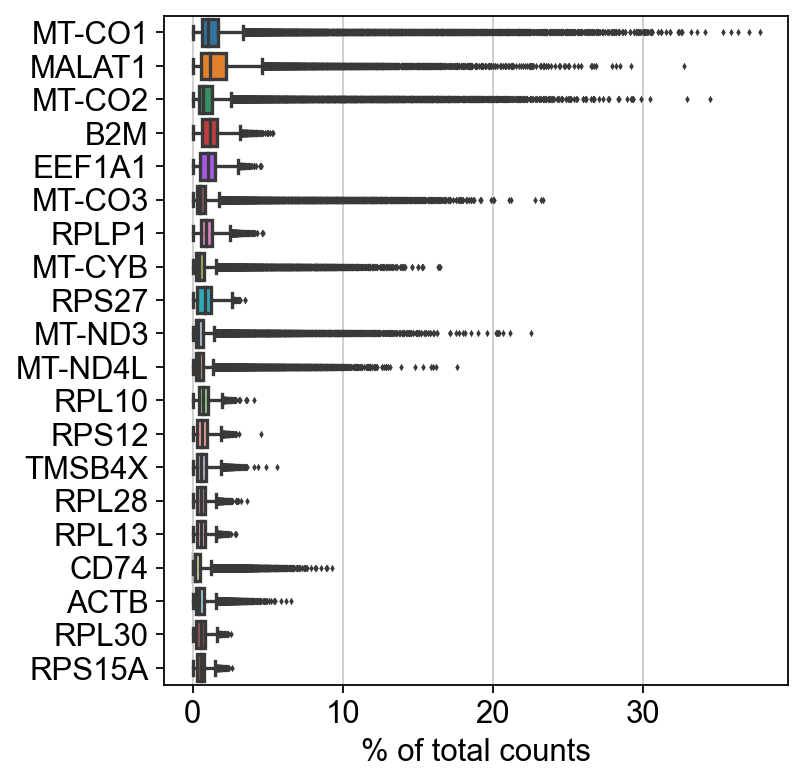

In [15]:
sc.pl.highest_expr_genes(adata, n_top=20, )

Basic filtering:

In [16]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

Let's assemble some information about mitochondrial genes, which are important for quality control.

Citing from "Simple Single Cell" workflows [(Lun, McCarthy & Marioni, 2017)](https://master.bioconductor.org/packages/release/workflows/html/simpleSingleCell.html#examining-gene-level-metrics):

> High proportions are indicative of poor-quality cells (Islam et al. 2014; Ilicic et al. 2016), possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.

With `pp.calculate_qc_metrics`, we can compute many metrics very efficiently.

In [17]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

A violin plot of some of the computed quality measures:

* the number of genes expressed in the count matrix
* the total counts per cell
* the percentage of counts in mitochondrial genes

... storing 'sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


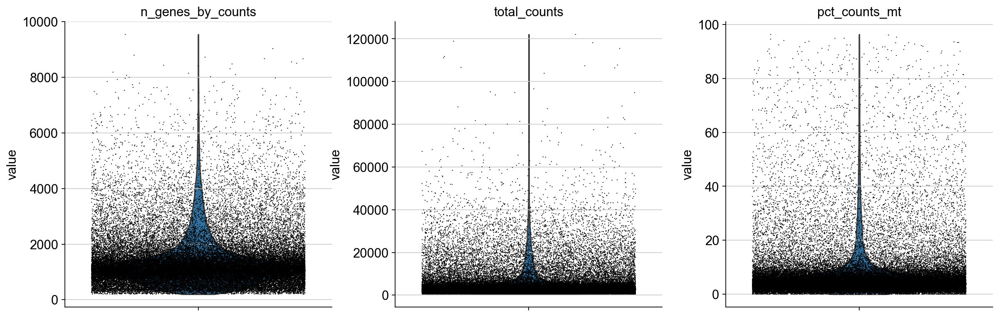

In [18]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

Remove cells that have too many mitochondrial genes expressed or too many total counts:

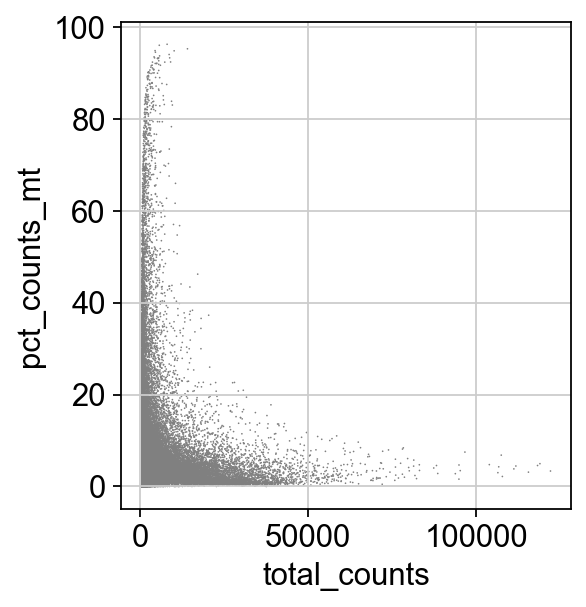

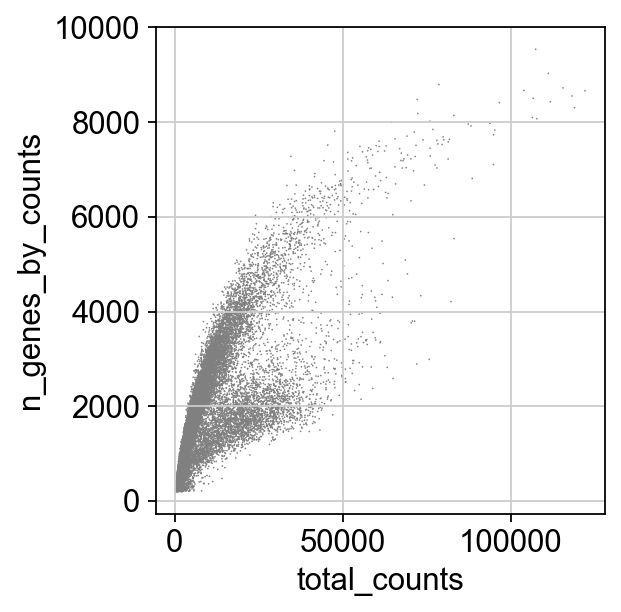

In [19]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

Actually do the filtering by slicing the `AnnData` object.

In [20]:
adata = adata[adata.obs.n_genes_by_counts < 3000, :]
adata = adata[adata.obs.pct_counts_mt < 17, :]

Total-count normalize (library-size correct) the data matrix $\mathbf{X}$ to 10,000 reads per cell, so that counts become comparable among cells.

In [21]:
sc.pp.normalize_total(adata, target_sum=1e4)

/Users/senosam/opt/anaconda3/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Logarithmize the data:

In [22]:
sc.pp.log1p(adata)

Identify highly-variable genes.

In [23]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

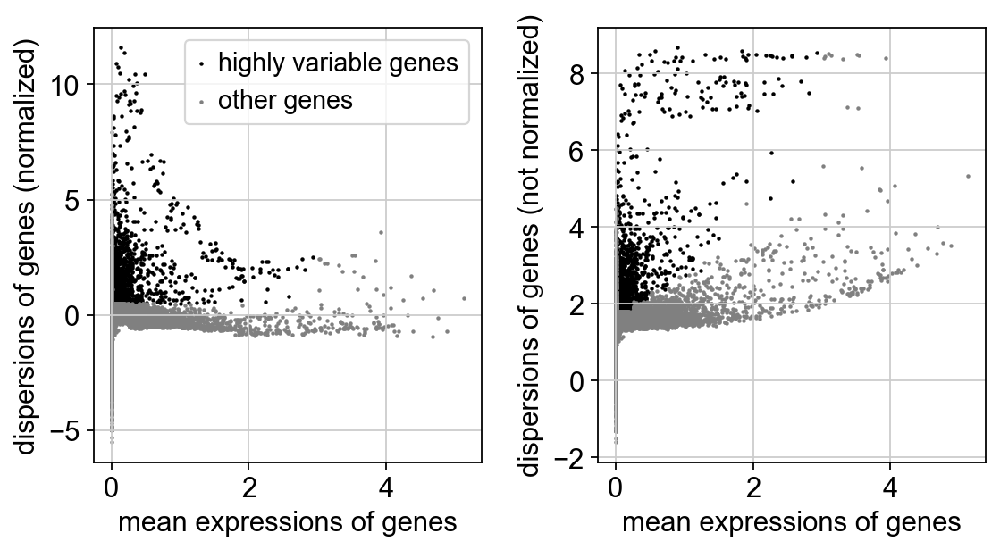

In [24]:
sc.pl.highly_variable_genes(adata)

Set the `.raw` attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.

<div class="alert alert-info">

**Note**

You can get back an `AnnData` of the object in `.raw` by calling `.raw.to_adata()`.

</div>    

In [25]:
adata.raw = adata

<div class="alert alert-info">

**Note**
    
If you don't proceed below with correcting the data with `sc.pp.regress_out` and scaling it via `sc.pp.scale`, you can also get away without using `.raw` at all.

The result of the previous highly-variable-genes detection is stored as an annotation in `.var.highly_variable` and auto-detected by PCA and hence, `sc.pp.neighbors` and subsequent manifold/graph tools. In that case, the step *actually do the filtering* below is unnecessary, too.

</div>

Actually do the filtering

In [26]:
adata = adata[:, adata.var.highly_variable]

Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [27]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

Scale each gene to unit variance. Clip values exceeding standard deviation 10. 

In [28]:
sc.pp.scale(adata, max_value=10)

## Principal component analysis

Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [29]:
sc.tl.pca(adata, svd_solver='arpack')

We can make a scatter plot in the PCA coordinates, but we will not use that later on.

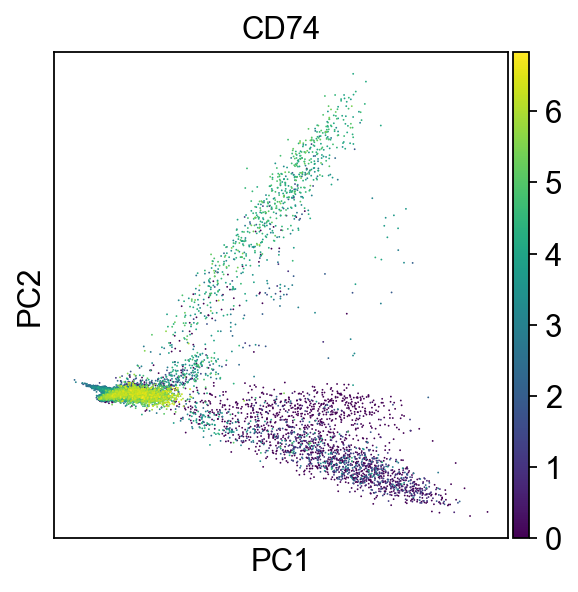

In [30]:
sc.pl.pca(adata, color='CD74')

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function  `sc.tl.louvain()` or tSNE `sc.tl.tsne()`. In our experience, often a rough estimate of the number of PCs does fine.

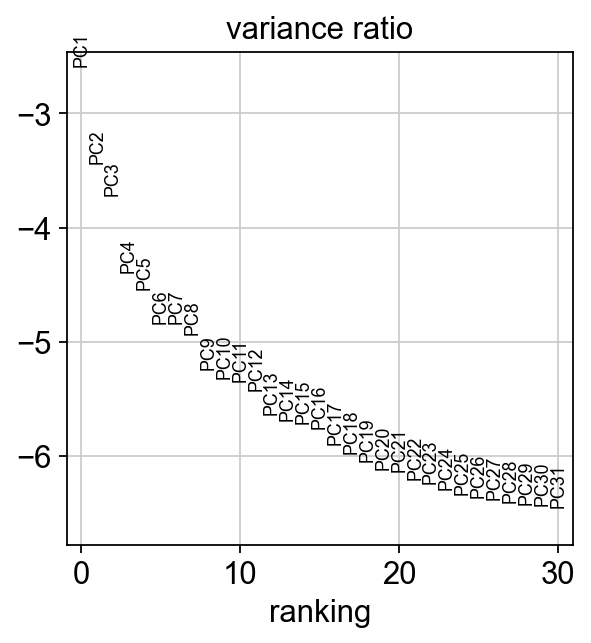

In [31]:
sc.pl.pca_variance_ratio(adata, log=True)

Save the result.

In [32]:
adata.write(results_file)

In [33]:
adata

AnnData object with n_obs × n_vars = 44876 × 1871
    obs: 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here.

In [34]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=27)

OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


## Embedding the neighborhood graph

We suggest embedding the graph in two dimensions using UMAP ([McInnes et al., 2018](https://arxiv.org/abs/1802.03426)), see below. It is potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preserves trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

```
tl.paga(adata)
pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
tl.umap(adata, init_pos='paga')
```

In [35]:
sc.tl.umap(adata,random_state=101)

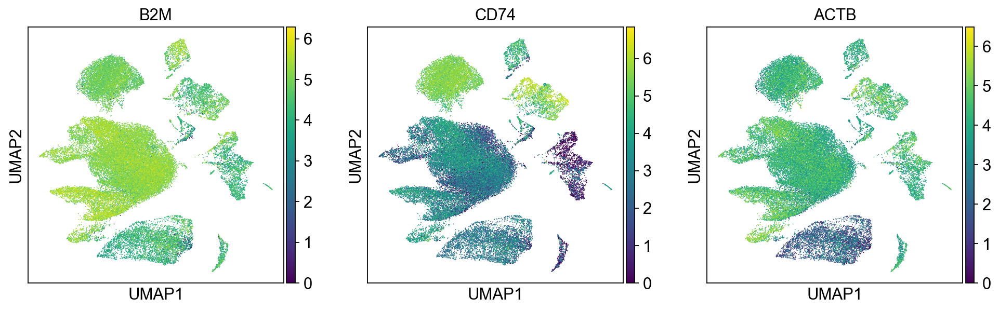

In [36]:
sc.pl.umap(adata, color=['B2M', 'CD74', 'ACTB'])

As we set the `.raw` attribute of `adata`, the previous plots showed the "raw" (normalized, logarithmized, but uncorrected) gene expression. You can also plot the scaled and corrected gene expression by explicitly stating that you don't want to use `.raw`.

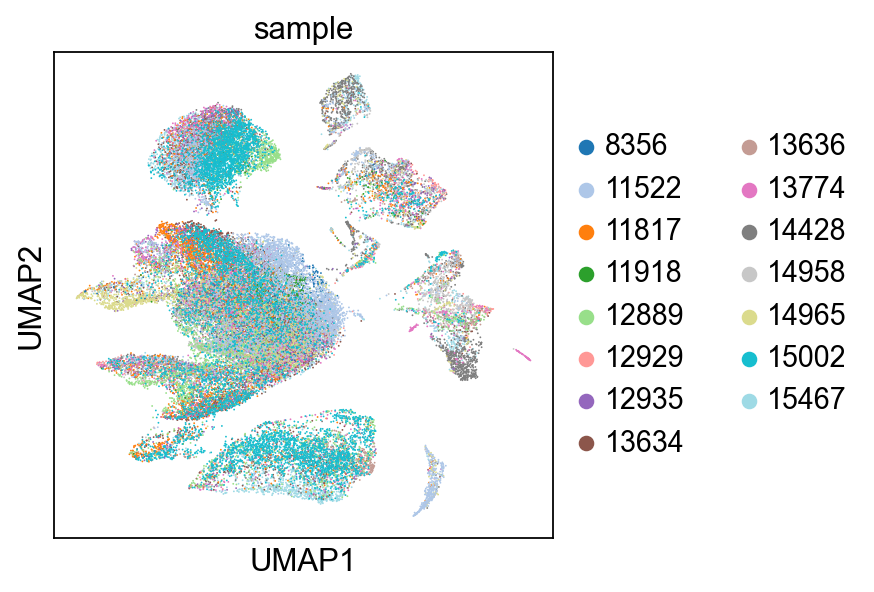

In [40]:
sc.pl.umap(adata, color=['sample'], palette='tab20')

## Clustering the neighborhood graph

As with Seurat and many other frameworks, we recommend the Leiden graph-clustering method (community detection based on optimizing modularity) by [Traag *et al.* (2018)](https://scanpy.readthedocs.io/en/latest/references.html#traag18). Note that Leiden clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.

In [38]:
sc.tl.leiden(adata)

Plot the clusters, which agree quite well with the result of Seurat.

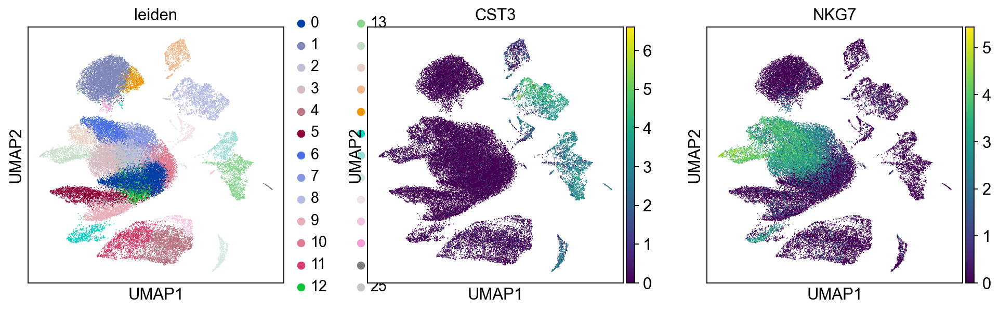

In [39]:
sc.pl.umap(adata, color=['leiden', 'CST3', 'NKG7'])

Save the result.

In [294]:
adata.write(results_file)

## Finding marker genes

https://www.genecards.org/cgi-bin/carddisp.pl?gene=CD74  
https://panglaodb.se/search.html?query=%22cd74%22&species=3&tumor=1&nonadult=0  

Let us compute a ranking for the highly differential genes in each cluster. For this, by default, the `.raw` attribute of AnnData is used in case it has been initialized before. The simplest and fastest method to do so is the t-test.

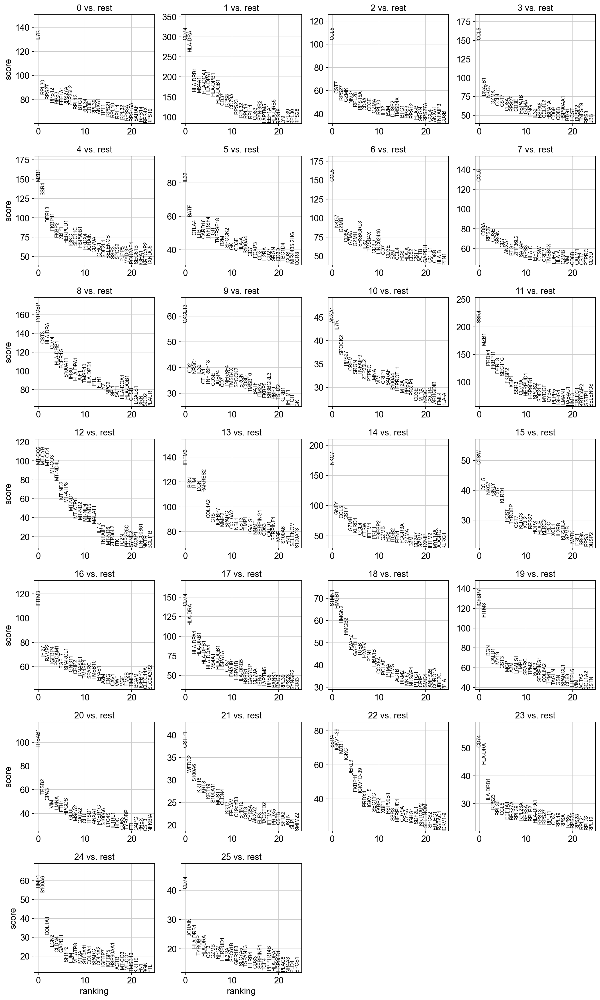

In [41]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [42]:
sc.settings.verbosity = 2  # reduce the verbosity

The result of a [Wilcoxon rank-sum (Mann-Whitney-U)](https://en.wikipedia.org/wiki/Mann%E2%80%93Whitney_U_test) test is very similar. We recommend using the latter in publications, see e.g., [Sonison & Robinson (2018)](https://doi.org/10.1038/nmeth.4612). You might also consider much more powerful differential testing packages like MAST, limma, DESeq2 and, for python, the recent diffxpy.

ranking genes
    finished (0:01:19)


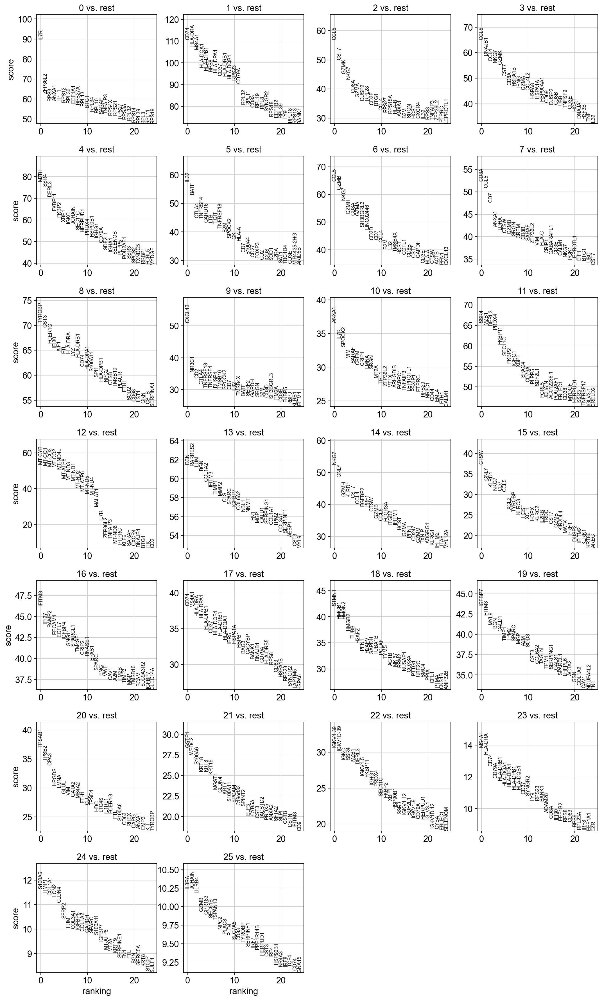

In [43]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

Save the result.

In [44]:
adata.write(results_file)

As an alternative, let us rank genes using logistic regression. For instance, this has been suggested by [Natranos et al. (2018)](https://doi.org/10.1101/258566). The essential difference is that here, we use a multi-variate appraoch whereas conventional differential tests are uni-variate. [Clark et al. (2014)](https://doi.org/10.1186/1471-2105-15-79) has more details.

ranking genes
    finished (0:02:49)


/Users/senosam/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


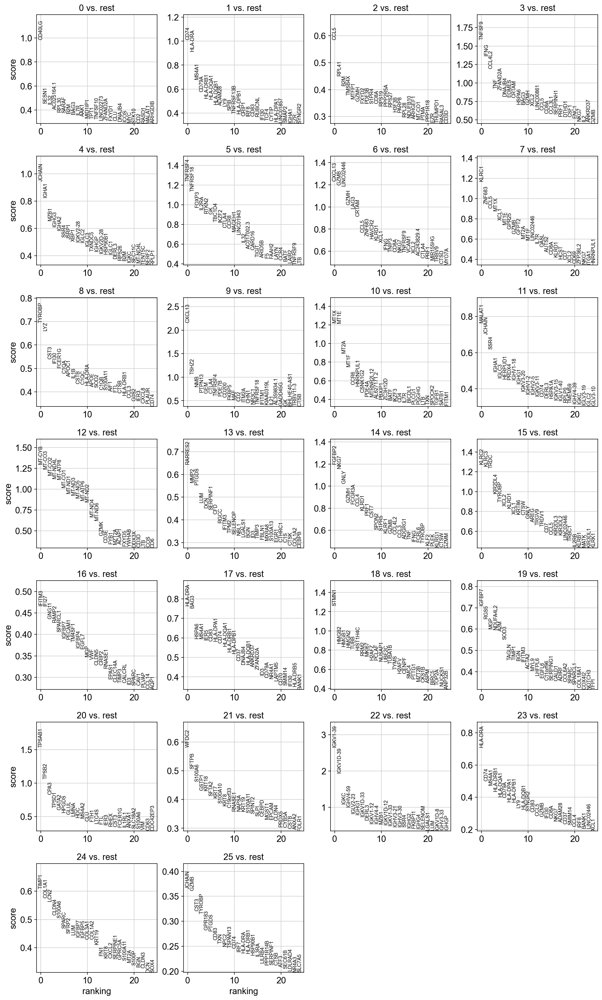

In [45]:
sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

With the exceptions of *IL7R*, which is only found by the t-test and *FCER1A*, which is only found by the other two appraoches, all marker genes are recovered in all approaches.

Louvain Group | Markers | Cell Type
---|---|---
0 | CD74, HLA-DRA | dentritic cells


many cluster have HLA-DRA as marker gene, maybe it's because some clusters are formed by samples, and not only cell types, we need to perform batch correction

In [46]:
import harmonypy as hm

In [47]:
ho = hm.run_harmony(adata.obsm['X_pca'], adata.obs, ['sample'])

2022-01-20 16:48:03,718 - harmonypy - INFO - Iteration 1 of 10
2022-01-20 16:48:20,500 - harmonypy - INFO - Iteration 2 of 10
2022-01-20 16:48:39,462 - harmonypy - INFO - Iteration 3 of 10
2022-01-20 16:48:55,457 - harmonypy - INFO - Converged after 3 iterations


In [48]:
# Write the adjusted PCs to the AnnData object
adata.obsm['X_harmony'] = ho.Z_corr.T

In [49]:
sc.pp.neighbors(adata, use_rep='X_harmony')

sc.tl.umap(adata)

computing neighbors
    finished (0:00:02)
computing UMAP
    finished (0:00:29)


In [50]:
adata.write(results_file)

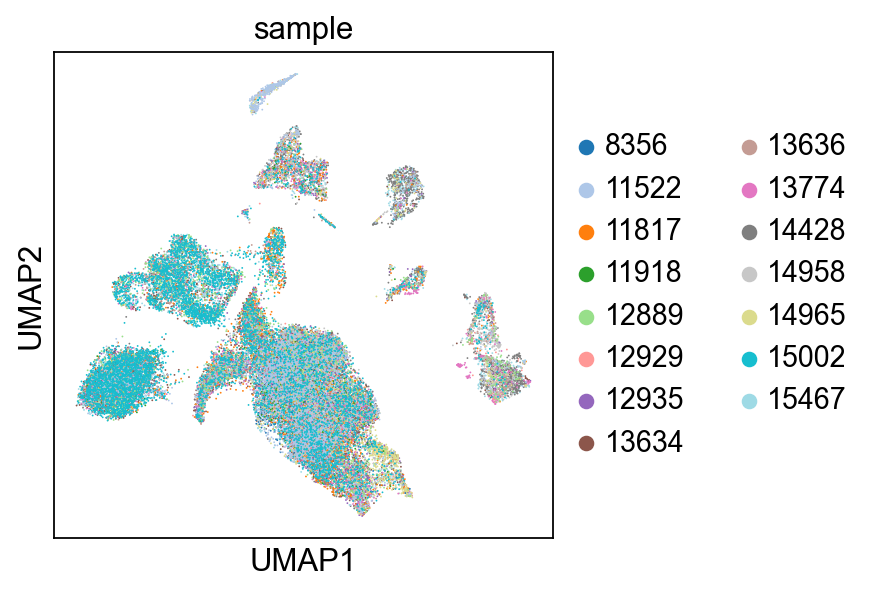

In [51]:
# plt.figure(figsize=(10,10))
# plt.scatter(adata.obsm['X_umap'][:,0], adata.obsm['X_umap'][:,1], c=adata.obs['sample'], alpha=0.1, s=3)
sc.pl.umap(adata, color=['sample'], palette='tab20')

Now sample batch effectss seem well corrected.

### Clustering after batch correction

In [52]:
sc.tl.leiden(adata)

running Leiden clustering
    finished (0:00:10)


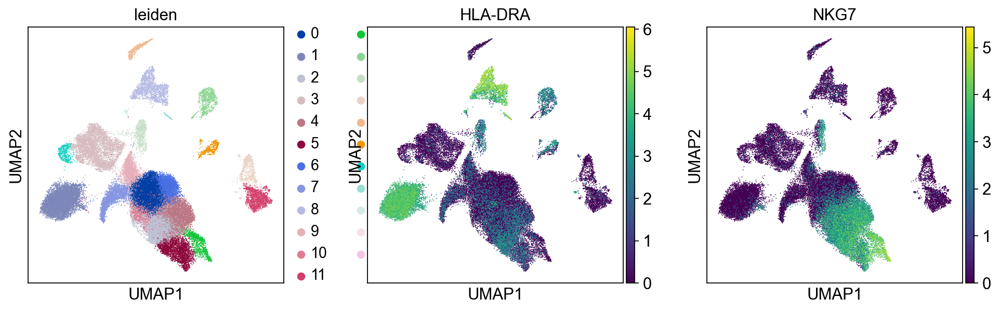

In [53]:
sc.pl.umap(adata, color=['leiden', 'HLA-DRA', 'NKG7'])

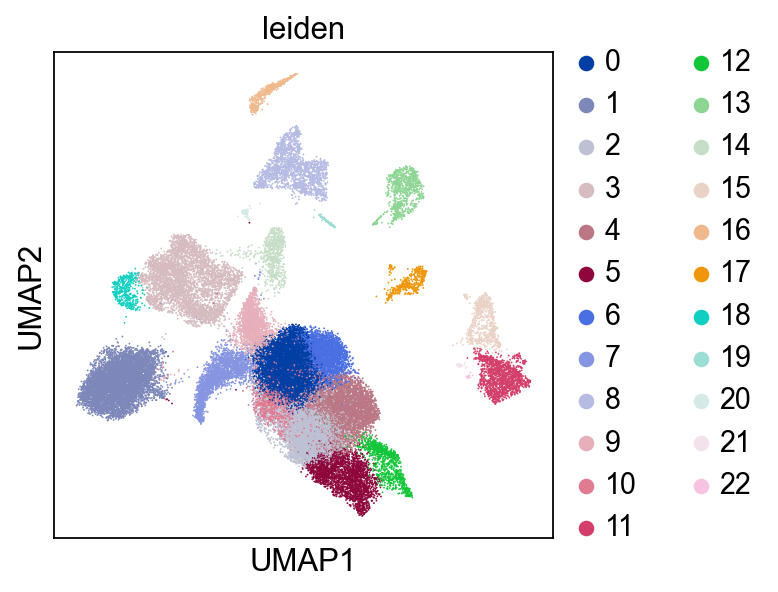

In [54]:
sc.pl.umap(adata, color=['leiden'])

In [55]:
adata.write(results_file)

## Finding marker genes after batch correction

https://www.genecards.org/cgi-bin/carddisp.pl?gene=CD74  
https://panglaodb.se/search.html?query=%22cd74%22&species=3&tumor=1&nonadult=0  

Let us compute a ranking for the highly differential genes in each cluster. For this, by default, the `.raw` attribute of AnnData is used in case it has been initialized before. The simplest and fastest method to do so is the t-test.

ranking genes
    finished (0:00:10)


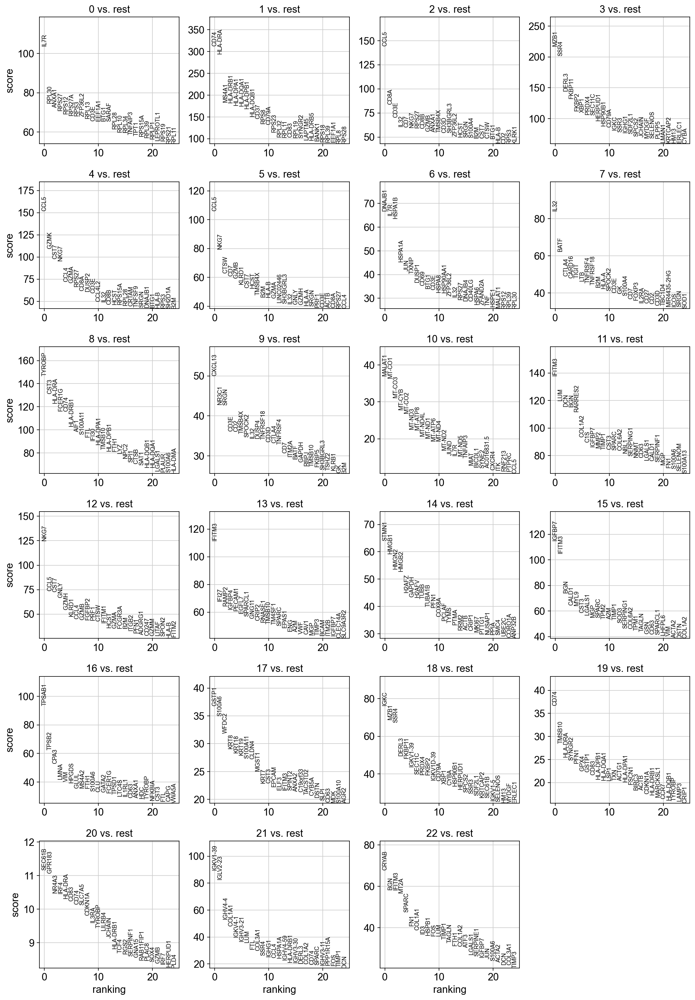

In [56]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [57]:
sc.settings.verbosity = 2  # reduce the verbosity

The result of a [Wilcoxon rank-sum (Mann-Whitney-U)](https://en.wikipedia.org/wiki/Mann%E2%80%93Whitney_U_test) test is very similar. We recommend using the latter in publications, see e.g., [Sonison & Robinson (2018)](https://doi.org/10.1038/nmeth.4612). You might also consider much more powerful differential testing packages like MAST, limma, DESeq2 and, for python, the recent diffxpy.

ranking genes
    finished (0:01:17)


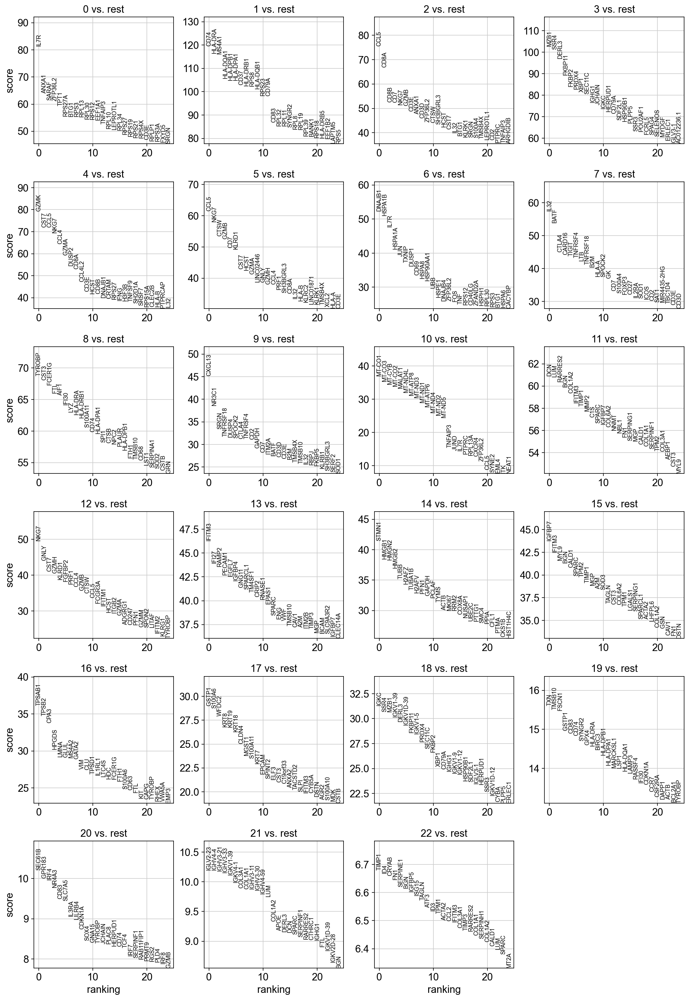

In [58]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

Save the result.

In [59]:
adata.write(results_file)

As an alternative, let us rank genes using logistic regression. For instance, this has been suggested by [Natranos et al. (2018)](https://doi.org/10.1101/258566). The essential difference is that here, we use a multi-variate appraoch whereas conventional differential tests are uni-variate. [Clark et al. (2014)](https://doi.org/10.1186/1471-2105-15-79) has more details.

ranking genes
    finished (0:02:45)


/Users/senosam/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


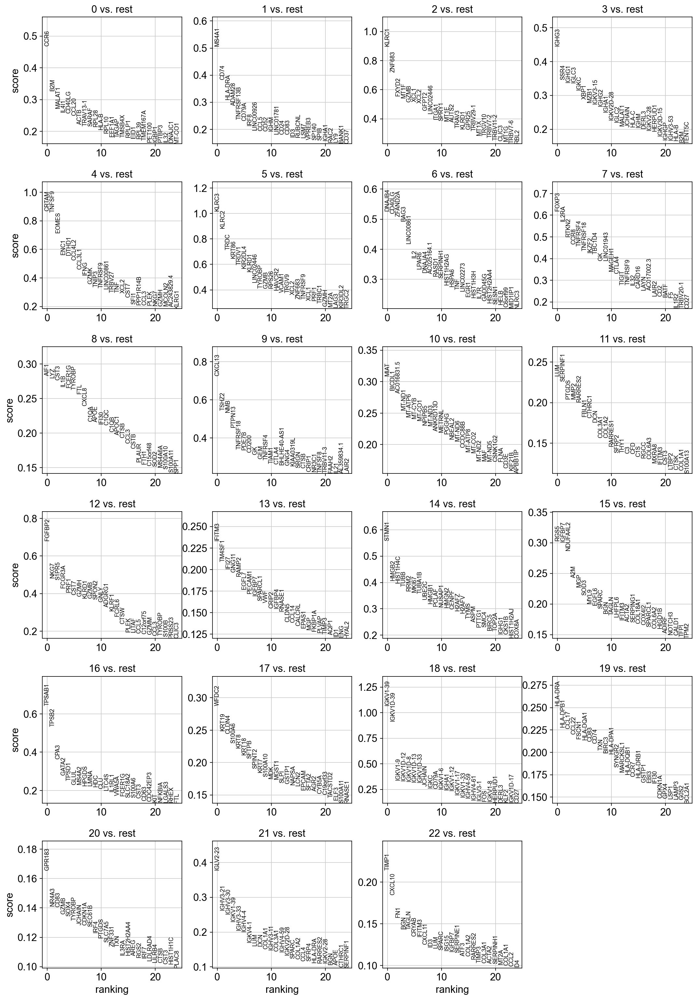

In [60]:
sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

With the exceptions of *IL7R*, which is only found by the t-test and *FCER1A*, which is only found by the other two appraoches, all marker genes are recovered in all approaches.

Louvain Group | Markers | Cell Type
---|---|---
0 | CD74, HLA-DRA | dentritic cells


Let us also define a list of marker genes for later reference.

In [61]:
marker_genes = ['IL7R', 'CD74', 'HLA-DRA', 'CCL5', 'CD8A', 'MZB1', 'SSR4', 'GZMK', 'CST7', 'NKG7', 'GNLY', 'IL32', 'BATF', 'TYROBP', 'CST3', 'CXCL13', 'IFITM3', 'MALAT1 ', 'STMN1', 'HMGB1', 'HMGB2', 'HMGN2', 'IGFBP7', 'S100A6', 'GSTP1', 'TPSAB1', 'TPSB2', 'IGKC', 'MZB1', 'IGKV1-39', 'IGLV2-23', 'MS4A1', 'CD7', 'CD8B', 'CD3E', 'DERL3', 'GZMA', 'DCN', 'LUM', 'BGN', 'TNFAIP3', 'CXCR4', 'JUND', 'BATF', 'IL32', 'CTLA4', 'TIGIT', 'NR3C1', 'STMN1', 'IGFBP7', 'MYL9', 'GSTP1', 'WFDC2', 'KRT19', 'KRT8', 'KRT18', 'TPSAB1', 'TPSB2', 'CPA3', 'GATA2', 'VIM', 'CD74', 'CD83', 'TXN', 'CDKN1A', 'CD40LG', 'CCR6', 'CCL20', 'MSS4A1', 'ADAM2B', 'TNFRSF13B', 'KLRC1', 'ZNF683', 'LINC02446', 'MT-C01', 'IGLC3', 'IGLC2', 'IGHA1', 'CRTAM', 'TNFSF9', 'ENC1', 'EOMES', 'CCL4L2', 'IFNG', 'KLRC3', 'KLRC2', 'TRDV1', 'TRDC', 'FOXP3', 'IL2RA', 'RTKN2', 'TNFRSF4', 'TNFRSF18', 'CCR8', 'LYZ', 'IL1B', 'NMB', 'TSHZ2', 'RARRES2', 'MMP2', 'PTGDS', 'SERPINF1', 'BICDL1', 'MIAT', 'IFITM3', 'IFI27', 'STMN1', 'IGFBP7', 'WFDC2', 'KRT19', 'TPSAB1', 'TPSB2', 'CPA3', 'IGKV1-39', 'IGKV1D-39', 'IGKV2-28', 'IGKV2D-28', 'IGKC', 'IGLV2-23', 'IGHV2-21']
marker_genes = list(set(marker_genes))

Reload the object that has been save with the Wilcoxon Rank-Sum test result.

In [62]:
adata = sc.read(results_file)

Show the 10 top ranked genes per cluster 0, 1, ..., 7 in a dataframe.

In [64]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,IL7R,CD74,CCL5,MZB1,GZMK,CCL5,DNAJB1,IL32,TYROBP,CXCL13,...,IFITM3,STMN1,IGFBP7,TPSAB1,GSTP1,IGKC,TXN,SEC61B,IGLV2-23,TIMP1
1,ANXA1,HLA-DRA,CD8A,SSR4,CST7,NKG7,HSPA1B,BATF,CST3,NR3C1,...,IFI27,HMGB1,IFITM3,TPSB2,S100A6,SSR4,TMSB10,GPR183,IGHV4-4,ID4
2,SARAF,MS4A1,CD8B,DERL3,CCL5,CTSW,IL7R,CTLA4,FCER1G,SRGN,...,RAMP2,HMGN2,MYL9,CPA3,WFDC2,MZB1,FSCN1,IRF4,IGHV3-21,CRYAB
3,ZFP36L2,HLA-DQA1,CD7,FKBP11,NKG7,GZMB,HSPA1A,CARD16,FTL,TNFRSF18,...,PECAM1,HMGB2,BGN,HPGDS,KRT8,IGKV1-39,GSTP1,NR4A3,IGHV3-33,FN1
4,TPT1,HLA-DPB1,NKG7,FKBP2,CCL4,CD7,JUN,TIGIT,AIF1,DUSP4,...,EGFL7,TUBB,CALD1,LMNA,KRT19,DERL3,CD83,CD83,IGKV1-39,SERPINE1
5,RPS27A,HLA-DPA1,GZMB,PRDX4,GZMA,KLRD1,TXNIP,TNFRSF4,IFI30,SPOCK2,...,IGFBP4,H2AFZ,SPARC,GLUL,KRT18,IGKV1D-39,CD74,SLC7A5,IGKV4-1,BGN
6,BTG1,CD37,CD3E,XBP1,DUSP2,CST7,DUSP1,LTB,LYZ,CTLA4,...,GNG11,TUBA1B,TPM2,MS4A2,CLDN4,FKBP11,SYNGR2,IL3RA,COL3A1,IGFBP5
7,RPS3,HLA-DRB1,ANXA1,SEC11C,CD8A,HCST,CD69,TNFRSF18,HLA-DRA,TNFRSF4,...,SPARCL1,H2AFV,TIMP1,GATA2,MGST1,IGKV1-5,GPX4,LILRB4,COL1A1,ISG15
8,RPL13,RPS8,CD3D,IGHG1,CCL4L2,GZMA,HSPA8,B2M,HLA-DRB1,CD2,...,TM4SF1,PFN1,MGP,VIM,S100A11,PRDX4,HLA-DRA,CDKN1A,IGHV3-11,TAGLN
9,RPL30,HLA-DQB1,ZFP36L2,JCHAIN,CD3E,LINC02446,HSP90AA1,HLA-A,S100A11,GAPDH,...,CRIP2,GAPDH,A2M,CLU,KRT7,SEC11C,BIRC3,SOX4,IGHV3-30,ATF3


Get a table with the scores and groups.

In [65]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,18_n,18_p,19_n,19_p,20_n,20_p,21_n,21_p,22_n,22_p
0,IL7R,0.0,CD74,0.0,CCL5,0.0,MZB1,0.0,GZMK,0.0,...,IGKC,3.420101e-215,TXN,6.211483e-55,SEC61B,1.897120e-24,IGLV2-23,2.168582e-24,TIMP1,2.409704e-11
1,ANXA1,0.0,HLA-DRA,0.0,CD8A,0.0,SSR4,0.0,CST7,0.0,...,SSR4,8.210111e-207,TMSB10,3.322561e-54,GPR183,1.284409e-23,IGHV4-4,2.179090e-24,ID4,2.592129e-11
2,SARAF,0.0,MS4A1,0.0,CD8B,0.0,DERL3,0.0,CCL5,0.0,...,MZB1,1.157027e-206,FSCN1,4.752100e-54,IRF4,2.197485e-23,IGHV3-21,2.575608e-24,CRYAB,2.754606e-11
3,ZFP36L2,0.0,HLA-DQA1,0.0,CD7,0.0,FKBP11,0.0,NKG7,0.0,...,IGKV1-39,1.576640e-199,GSTP1,1.099862e-50,NR4A3,1.423610e-22,IGHV3-33,3.413216e-24,FN1,3.021464e-11
4,TPT1,0.0,HLA-DPB1,0.0,NKG7,0.0,FKBP2,0.0,CCL4,0.0,...,DERL3,8.974499e-194,CD83,3.619451e-50,CD83,2.178274e-21,IGKV1-39,4.924999e-24,SERPINE1,3.579049e-11


Compare to a single cluster: 

ranking genes
    finished (0:00:16)


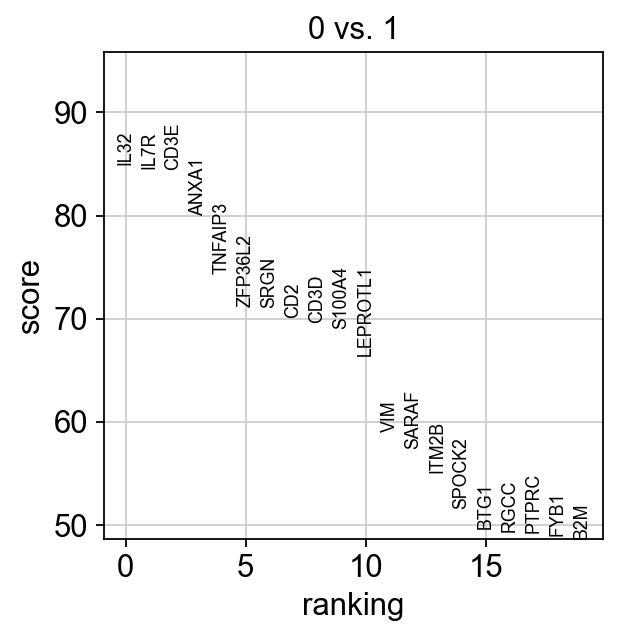

In [66]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['0'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=20)

If we want a more detailed view for a certain group, use `sc.pl.rank_genes_groups_violin`.

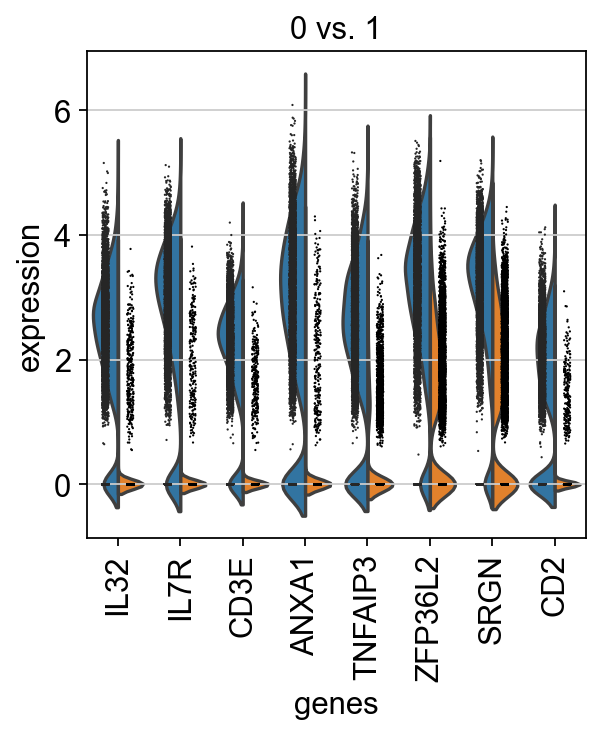

In [67]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

Reload the object with the computed differential expression (i.e. DE via a comparison with the rest of the groups):

In [68]:
adata = sc.read(results_file)

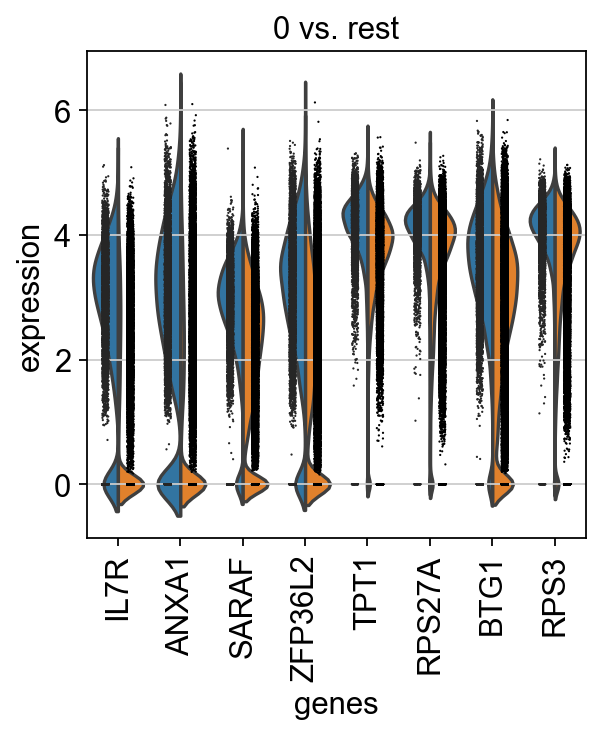

In [69]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

If you want to compare a certain gene across groups, use the following.

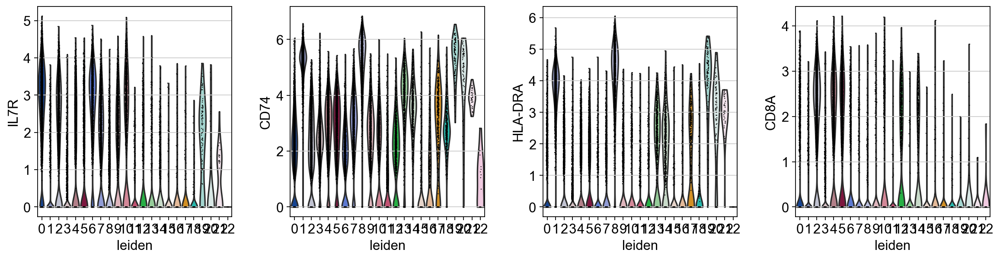

In [70]:
sc.pl.violin(adata, ['IL7R', 'CD74', 'HLA-DRA', 'CD8A'], groupby='leiden')

Actually mark the cell types.

In [71]:
# new_cluster_names = [
#     'CD4 T', 'CD14 Monocytes',
#     'B', 'CD8 T', 
#     'NK', 'FCGR3A Monocytes',
#     'Dendritic', 'Megakaryocytes']
# adata.rename_categories('leiden', new_cluster_names)

In [72]:
# sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='.pdf')

Now that we annotated the cell types, let us visualize the marker genes.

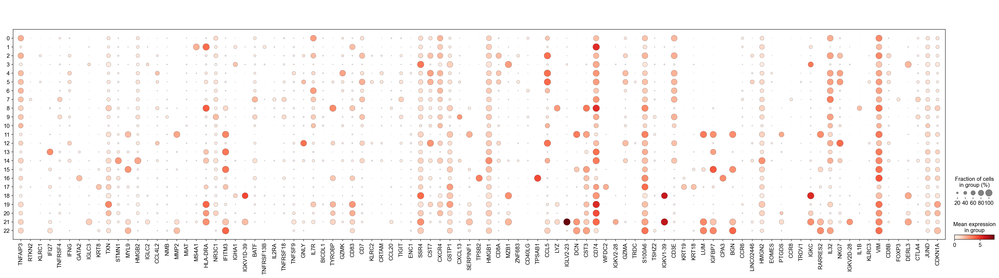

In [73]:
markers = list(set(marker_genes) - set(['ADAM2B', 'CPA3GATA2', 'IGHV2-21', 'MALAT1 ', 'MSS4A1', 'MT-C01']))
sc.pl.dotplot(adata, markers, groupby='leiden');

There is also a very compact violin plot.

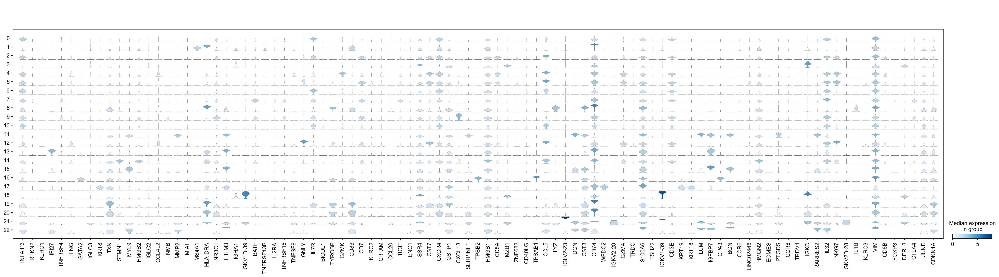

In [74]:
sc.pl.stacked_violin(adata, markers, groupby='leiden', rotation=90);

During the course of this analysis, the AnnData accumlated the following annotations.

In [75]:
adata

AnnData object with n_obs × n_vars = 44876 × 1871
    obs: 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [76]:
adata.write(results_file, compression='gzip')  # `compression='gzip'` saves disk space, but slows down writing and subsequent reading

Get a rough overview of the file using `h5ls`, which has many options - for more details see [here](https://github.com/theislab/scanpy_usage/blob/master/170505_seurat/info_h5ad.md). The file format might still be subject to further optimization in the future. All reading functions will remain backwards-compatible, though.

If you want to share this file with people who merely want to use it for visualization, a simple way to reduce the file size is by removing the dense scaled and corrected data matrix. The file still contains the raw data used in the visualizations in `adata.raw`.

In [77]:
adata.raw.to_adata().write('../../data/TMA36_project/sc_RNAseq/processed/analyzed/all_samples_withoutX.h5ad')

If you want to export to "csv", you have the following options:

In [330]:
# Export single fields of the annotation of observations
# adata.obs[['n_counts', 'louvain_groups']].to_csv(
#     './write/pbmc3k_corrected_louvain_groups.csv')

# Export single columns of the multidimensional annotation
# adata.obsm.to_df()[['X_pca1', 'X_pca2']].to_csv(
#     './write/pbmc3k_corrected_X_pca.csv')

# Or export everything except the data using `.write_csvs`.
# Set `skip_data=False` if you also want to export the data.
# adata.write_csvs(results_file[:-5], )

### Automatic cell type annotation

In [331]:
sys.path.append('../../../scoreCT/src/')
import scorect_api as ct

In [332]:
def get_markers_from_db(species, tissue, url=None):
    """
    Get reference from Cell Marker Database
    """
    if url is None:
        url = "http://biocc.hrbmu.edu.cn/CellMarker/download/all_cell_markers.txt"
    req = requests.get(url)
    parsed_file = []
    for chunk in req.iter_lines():
        chunk = chunk.decode("utf-8").split('\t')
        parsed_file.append(chunk)

    marker_df = pd.DataFrame(columns=parsed_file[0], data=parsed_file[1:])

    # Subset for interesting information
    sub_df = marker_df[marker_df['speciesType'] == species]
    #sub_df = sub_df[sub_df['tissueType'] == tissue]

    # Parse information to create new reference
    list_ct = sub_df['cellName'].unique().tolist()
    # Use re to remove special characters
    dict_marker = {
        ct: [re.split('\W+', gene) for gene in sub_df[sub_df['cellName'] == ct]['geneSymbol'].unique().tolist()]
        for ct in list_ct}

    # merge nested lists without spelling strings
    for ct in dict_marker.keys():
        dict_marker[ct] = list(
            itertools.chain.from_iterable(itertools.repeat(x, 1) if isinstance(x, str) else x for x in dict_marker[ct]))

    # Use dict to initialize df. Here order in memory doesn't mess with loading.
    ref_df = pd.DataFrame({ct: pd.Series(genes) for ct, genes in dict_marker.items()})
    return ref_df

In [359]:
#ref_marker = get_markers_from_db(species='Human', tissue=None, url=None) # option tissue=None home-made
ref_marker = ct.get_markers_from_db(species='Human', tissue='Lung', url=None) # option tissue=None home-made

In [360]:
marker_df = ct.wrangle_ranks_from_anndata(adata)
print(marker_df.head())

Wrangling: Number of markers used in ranked_gene_groups:  23905
Wrangling: Groups used for ranking: leiden
     z_score  adj_pvals     gene cluster_number
0  81.326553        0.0     IL7R              0
1  63.920200        0.0    ANXA1              0
2  61.354393        0.0    SARAF              0
3  61.213787        0.0  ZFP36L2              0
4  59.313656        0.0     TPT1              0


In [361]:
# Score cell types for each cluster 
# Let's set parameters first - K represents the number of genes included in the ranking
# m represents the number of bins used to divide the top K genes.
K = 300
m = 5
# Get the background genes - here, all the genes used to run the differential gene expression test
background = adata.raw.var.index.tolist()
# Now run the function
ct_pval, ct_score = ct.celltype_scores(nb_bins=m,
                                        ranked_genes=marker_df,
                                        K_top = K,
                                        marker_ref=ref_marker,
                                        background_genes=background)

/Users/senosam/opt/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


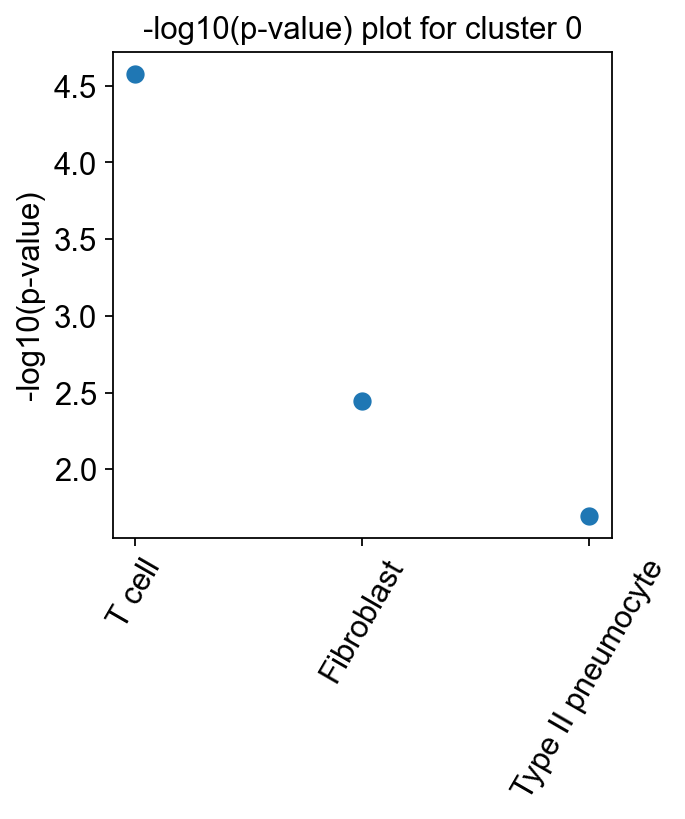

/Users/senosam/opt/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


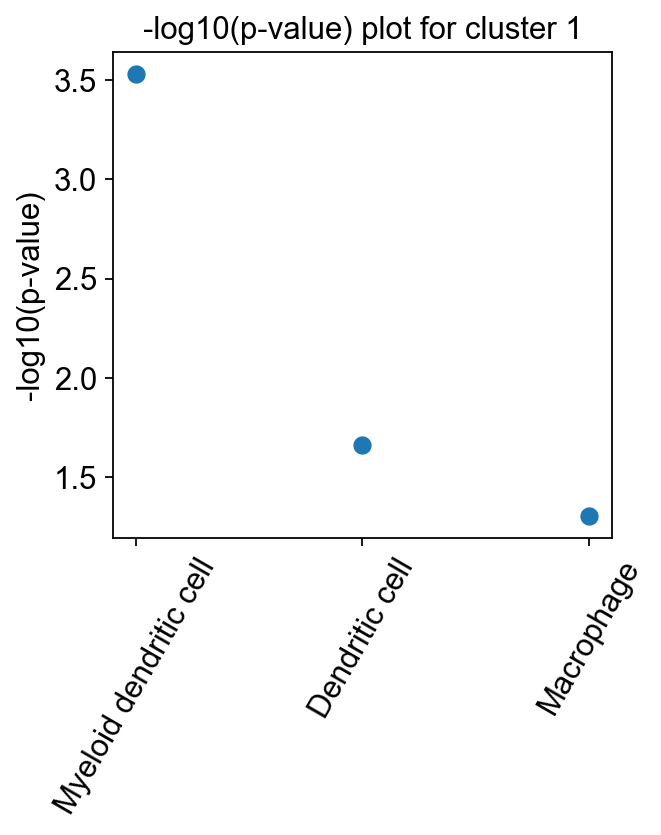

In [362]:
# Let's have a look at the pvalue for cluster 0
ct.plot_pvalue(ct_pval, clusters=['0','1'], n_types=3)

... storing 'scorect' as categorical


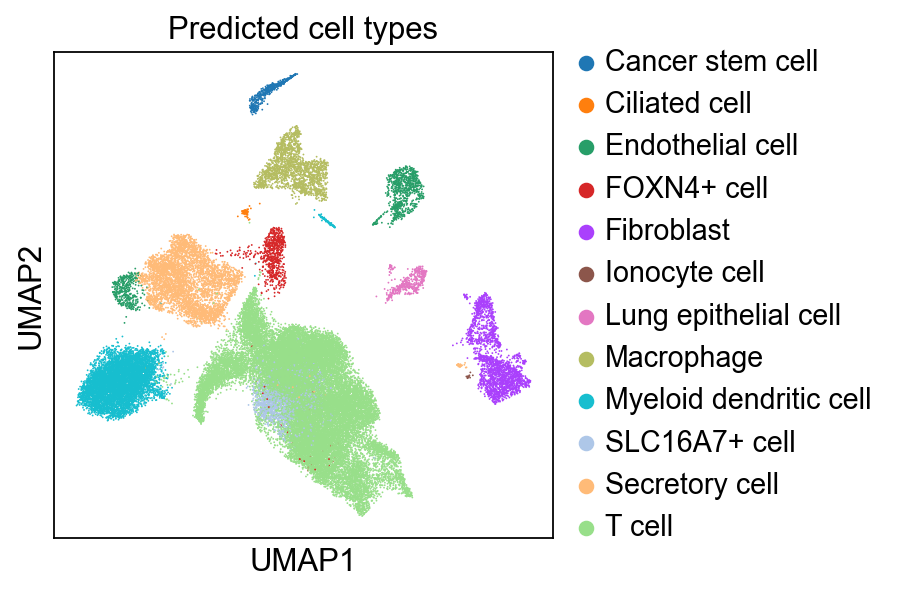

In [363]:
# Now assign clusters to cell types
cluster_assign = adata.obs['leiden']
celltype_assign = ct.assign_celltypes(cluster_assignment=cluster_assign, ct_pval_df=ct_pval, ct_score_df=ct_score, cutoff=0.1)
# Add to anndata object
adata.obs['scorect'] = celltype_assign
# Let's compare with the true assignment now! 
sc.pl.umap(adata, color=['scorect'], title=['Predicted cell types'], cmap='Set2')

In [364]:
count_mat = pd.crosstab(adata.obs['sample'], adata.obs['scorect'])
count_mat

scorect,Cancer stem cell,Ciliated cell,Endothelial cell,FOXN4+ cell,Fibroblast,Ionocyte cell,Lung epithelial cell,Macrophage,Myeloid dendritic cell,SLC16A7+ cell,Secretory cell,T cell
sample,,,,,,,,,,,,
8356,0,1,0,2,0,0,0,5,3,33,0,283
11522,305,10,67,29,52,0,11,113,639,131,90,3384
11817,12,6,17,150,24,0,49,175,328,110,116,1991
11918,0,0,0,4,0,0,2,38,55,58,0,140
12889,1,3,59,38,125,0,25,37,572,80,493,1437
12929,3,3,11,5,115,1,15,124,70,42,66,646
12935,1,16,9,25,23,0,18,91,191,69,64,1146
13634,9,6,44,57,74,0,9,91,647,209,248,3355
13636,0,1,47,30,114,0,6,36,128,36,374,384


In [365]:
# normalize per rows (samples, i.e. patients)
cell_per_pat = count_mat.div(count_mat.sum(axis=1), axis=0)

In [366]:
cell_per_pat

scorect,Cancer stem cell,Ciliated cell,Endothelial cell,FOXN4+ cell,Fibroblast,Ionocyte cell,Lung epithelial cell,Macrophage,Myeloid dendritic cell,SLC16A7+ cell,Secretory cell,T cell
sample,,,,,,,,,,,,
8356,0.000000,0.003058,0.000000,0.006116,0.000000,0.000000,0.000000,0.015291,0.009174,0.100917,0.000000,0.865443
11522,0.063134,0.002070,0.013869,0.006003,0.010764,0.000000,0.002277,0.023391,0.132271,0.027117,0.018630,0.700476
11817,0.004030,0.002015,0.005709,0.050369,0.008059,0.000000,0.016454,0.058764,0.110141,0.036938,0.038952,0.668570
11918,0.000000,0.000000,0.000000,0.013468,0.000000,0.000000,0.006734,0.127946,0.185185,0.195286,0.000000,0.471380
12889,0.000348,0.001045,0.020557,0.013240,0.043554,0.000000,0.008711,0.012892,0.199303,0.027875,0.171777,0.500697
12929,0.002725,0.002725,0.009991,0.004541,0.104450,0.000908,0.013624,0.112625,0.063579,0.038147,0.059946,0.586739
12935,0.000605,0.009679,0.005445,0.015124,0.013914,0.000000,0.010889,0.055051,0.115547,0.041742,0.038717,0.693285
13634,0.001895,0.001263,0.009265,0.012003,0.015582,0.000000,0.001895,0.019162,0.136239,0.044009,0.052222,0.706465
13636,0.000000,0.000865,0.040657,0.025952,0.098616,0.000000,0.005190,0.031142,0.110727,0.031142,0.323529,0.332180


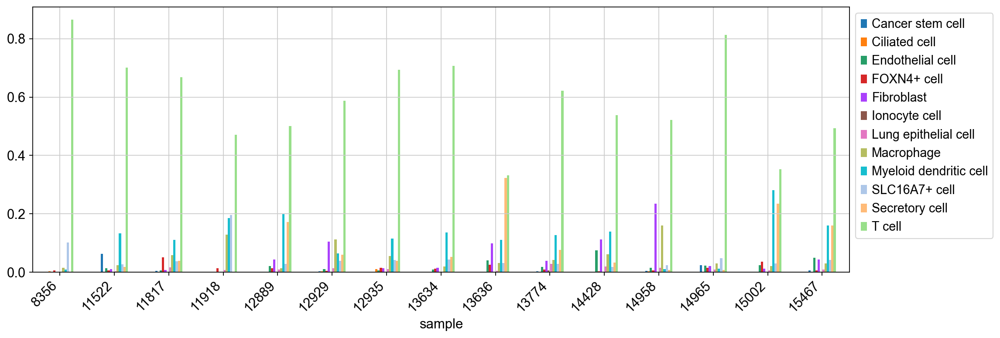

In [367]:
fig, ax = plt.subplots(figsize=(15,5))
cell_per_pat.plot.bar(ax=ax)
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.xticks(rotation=45, ha='right');

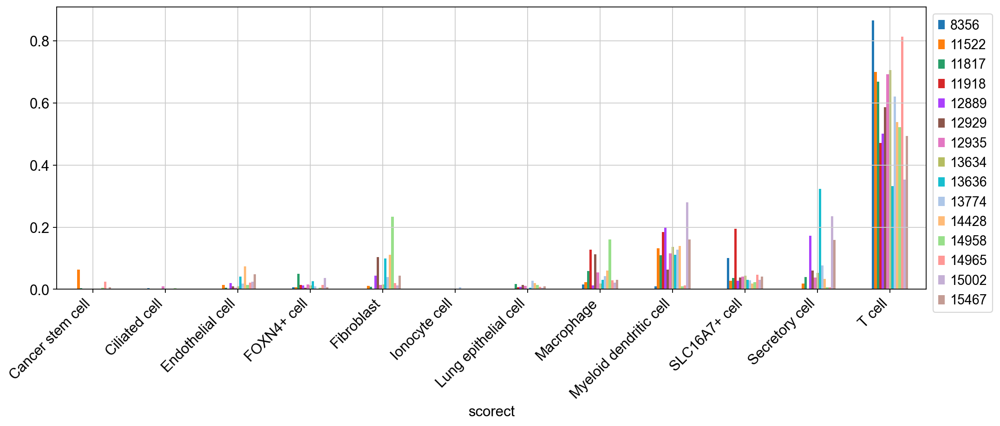

In [368]:
fig, ax = plt.subplots(figsize=(15,5))
cell_per_pat.T.plot.bar(ax=ax)
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.xticks(rotation=45, ha='right');

In [417]:
cell_per_pat_per_cell = cell_per_pat.div(cell_per_pat.sum(axis=0), axis=1)

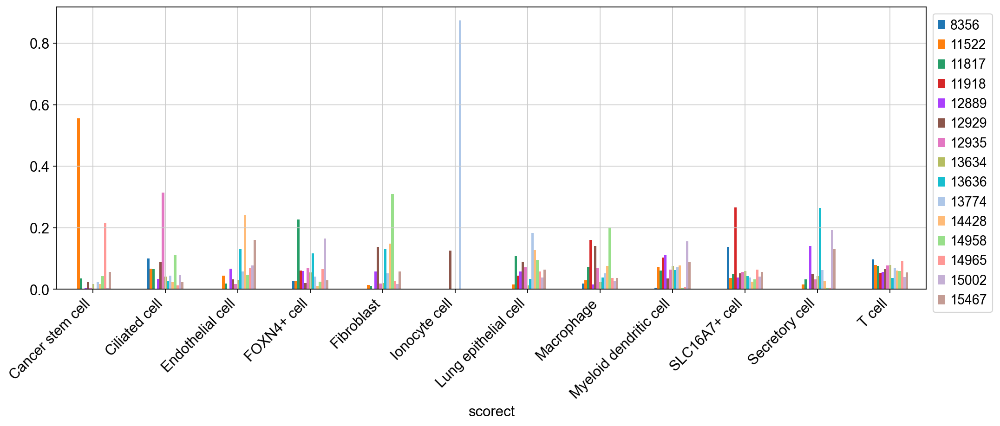

In [418]:
fig, ax = plt.subplots(figsize=(15,5))
cell_per_pat_per_cell.T.plot.bar(ax=ax)
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.xticks(rotation=45, ha='right');

In [453]:
cell_per_pat_centered = cell_per_pat/cell_per_pat.std()

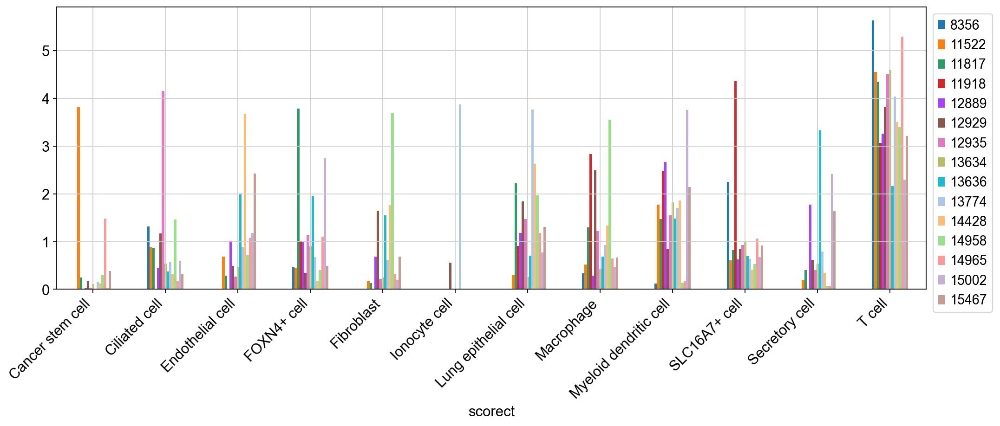

In [454]:
fig, ax = plt.subplots(figsize=(15,5))
cell_per_pat_centered.T.plot.bar(ax=ax)
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.xticks(rotation=45, ha='right');

### Cell type identification with CellO

see the [publication](https://www.cell.com/iscience/pdf/S2589-0042(20)31110-X.pdf) and the github [repo](https://github.com/deweylab/CellO) for the tutorial

Actually the package doesn't work, I tried to correect it, it's a nightmare ^^'

In [345]:
# # Specify CellO’s resource location
# cello_resource_loc = "../data/intermediate/cello"
# cello_resource_loc = "/home/alexis/Projects/Mafe_scRNAseq/data/intermediate/cello/"
# if not os.path.exists(cello_resource_loc):
#     print("creating directory")
#     os.makedirs(cello_resource_loc)
# else:
#     print("directory already exists")

Because CellO's pre-trained models expect different genes than those in the current expression matrix, we will need to train a new CellO classifier using CellO's built-in training set.

first download from cello's server with multithreaded downloads, because the server is pretty slow...
```bash
sudo apt install axel
cd data/intermediate/cello
axel -a -n 50 http://deweylab.biostat.wisc.edu/cell_type_classification/resources_v2.0.0.tar.gz
```

In [346]:
# model_prefix = "Mafe_lung_scRNAseq" # <-- The trained model will be stored in a file called Mafe_lung_scRNAseq.model.dill 

# reload(cello)
# cello.scanpy_cello(
#     adata, 
#     'leiden',
#     cello_resource_loc, 
#     out_prefix=model_prefix,
# )

If you have a pre-trained model that is compatible with the genes in the target expression matrix, then we can run CellO without training a new model. For example, once we run Step 11, we don't need to run it again. We simply use the trained model from that step.

In [347]:
# cello.scanpy_cello(
#     adata, 
#     'leiden',
#     cello_resource_loc, 
#     model_file=f'{model_prefix}.model.dill'
# )

In [348]:
# sc.pl.umap(adata, color=['leiden', 'Most specific cell type', 'T cell (probability)', 'T cell (binary)'])

#### Visualize cell type probabilities assigned to a specific cluster overlaid on the Cell Ontology graph

In [349]:
# cello.cello_probs(adata, '0', cello_rsrc_loc, 0.2, clust_key='leiden')

## Clinical data

We look at indolent vs aggressive

In [602]:
y_name = 'n_op2'
clinic = pd.read_csv("../../data/TMA36_project/CDE/CDE_TMA36_2021SEPT21_DR_MF.csv", index_col=0)
clinic.index=clinic.index.astype('str')
df_target=clinic.loc[sample_names]
df_target=df_target[[y_name]]

In [603]:
#count_mat_normed = (count_mat-count_mat.mean())/count_mat.std()
count_mat = pd.crosstab(adata.obs['sample'], adata.obs['scorect'])
cell_per_pat = count_mat.div(count_mat.sum(axis=1), axis=0)
count_mat_normed = cell_per_pat

In [604]:
count_mat_normed.index = count_mat_normed.index.astype(str)
count_mat_normed = df_target.join(count_mat_normed).dropna()
count_mat_normed.drop(count_mat_normed[count_mat_normed['n_op2']=='int'].index, inplace = True)

In [606]:
# "Melt" the dataset to "long-form" or "tidy" representation
melt_cell_per_pat_per_cell = pd.melt(count_mat_normed, 
                                     id_vars=y_name, 
                                     value_vars=count_mat_normed.columns[1:],
                                     var_name='cell type',
                                     value_name='proportion')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ind vs. agg: Mann-Whitney-Wilcoxon test two-sided, P_val:7.195e-01 U_stat=2.400e+01
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ind vs. agg: Mann-Whitney-Wilcoxon test two-sided, P_val:8.303e-01 U_stat=2.300e+01
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ind vs. agg: Mann-Whitney-Wilcoxon test two-sided, P_val:9.995e-02 U_stat=9.000e+00
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ind vs. agg: Mann-Whitne

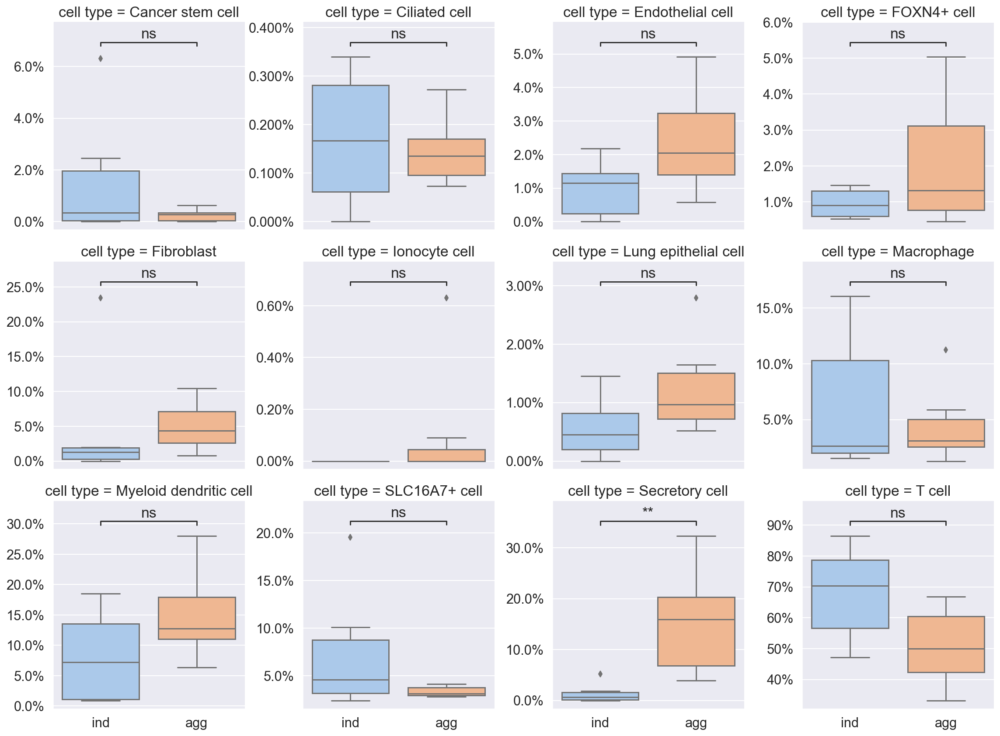

In [607]:
#plt.figure(figsize=(20,5))

plotting_parameters = {
    'x':       y_name,
    'y':       'proportion',
    'order':   ['ind', 'agg'],
    'palette': 'pastel',
}

pairs = [('ind', 'agg')]

with sns.plotting_context("notebook", font_scale=1.4):
    annot = Annotator(None, pairs)

    g = sns.FacetGrid(melt_cell_per_pat_per_cell, 
                      col='cell type', col_wrap = 4,
                      sharey=False, height=4)

    g.map_dataframe(annot.plot_and_annotate_facets, plot='boxplot',
                    plot_params=plotting_parameters,
                    configuration={"test": "Mann-Whitney"}, annotation_func="apply_test"
                   )
    for ax in g.axes.flat:
        ax.yaxis.set_major_formatter(PercentFormatter(1))

    plt.show()

### Original clusters

In [528]:
sample_cancer_mapper = df_target.to_dict()[y_name]
sample_cancer_mapper

{'12929': 'agg',
 '15467': 'agg',
 '13634': 'ind',
 '14428': 'int',
 '11817': 'agg',
 '14958': 'ind',
 '12935': 'int',
 '13636': 'agg',
 '13774': 'agg',
 '7984': 'ind',
 '14965': 'ind',
 '12889': 'agg',
 '8356': 'ind',
 '11918': 'ind',
 '11522': 'ind',
 '15002': 'agg'}

In [529]:
adata.obs['cancer type'] = adata.obs['sample'].map(sample_cancer_mapper)

... storing 'cancer type' as categorical


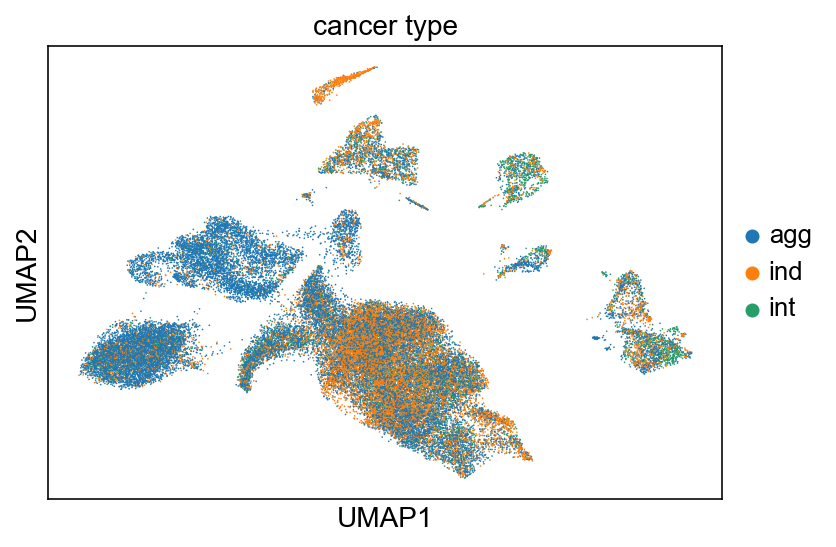

In [530]:
sc.pl.umap(adata, color=['cancer type'])

In [531]:
count_mat = pd.crosstab(adata.obs['sample'], adata.obs['leiden'])
count_mat

leiden,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
sample,,,,,,,,,,,,,,,,,,,,,
8356,94,3,80,0,38,12,36,4,5,3,...,0,2,0,0,0,0,0,1,0,0
11522,1072,624,1065,90,383,222,336,181,113,96,...,53,29,18,305,11,14,15,10,0,0
11817,300,317,380,116,315,363,100,230,175,229,...,9,150,16,12,49,8,11,6,0,0
11918,42,52,17,0,43,9,9,8,38,8,...,0,4,0,0,2,0,3,0,0,0
12889,323,570,129,493,168,163,213,216,37,202,...,5,38,34,1,25,54,2,3,0,0
12929,226,67,76,66,106,38,51,104,124,24,...,7,5,28,3,15,4,3,3,0,1
12935,321,189,124,64,145,191,83,147,91,103,...,6,25,11,1,18,3,2,16,0,0
13634,966,640,490,248,564,381,356,173,91,370,...,17,57,18,9,9,27,7,6,0,0
13636,94,125,30,374,23,41,52,88,36,50,...,14,30,53,0,6,33,3,1,0,0


In [532]:
# normalize per rows (samples, i.e. patients)
cell_per_pat = count_mat.div(count_mat.sum(axis=1), axis=0)

In [533]:
cell_per_pat

leiden,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
sample,,,,,,,,,,,,,,,,,,,,,
8356,0.287462,0.009174,0.244648,0.000000,0.116208,0.036697,0.110092,0.012232,0.015291,0.009174,...,0.000000,0.006116,0.000000,0.000000,0.000000,0.000000,0.000000,0.003058,0.000000,0.000000
11522,0.221900,0.129166,0.220451,0.018630,0.079280,0.045953,0.069551,0.037466,0.023391,0.019872,...,0.010971,0.006003,0.003726,0.063134,0.002277,0.002898,0.003105,0.002070,0.000000,0.000000
11817,0.100739,0.106447,0.127602,0.038952,0.105776,0.121894,0.033580,0.077233,0.058764,0.076897,...,0.003022,0.050369,0.005373,0.004030,0.016454,0.002686,0.003694,0.002015,0.000000,0.000000
11918,0.141414,0.175084,0.057239,0.000000,0.144781,0.030303,0.030303,0.026936,0.127946,0.026936,...,0.000000,0.013468,0.000000,0.000000,0.006734,0.000000,0.010101,0.000000,0.000000,0.000000
12889,0.112544,0.198606,0.044948,0.171777,0.058537,0.056794,0.074216,0.075261,0.012892,0.070383,...,0.001742,0.013240,0.011847,0.000348,0.008711,0.018815,0.000697,0.001045,0.000000,0.000000
12929,0.205268,0.060854,0.069028,0.059946,0.096276,0.034514,0.046322,0.094460,0.112625,0.021798,...,0.006358,0.004541,0.025431,0.002725,0.013624,0.003633,0.002725,0.002725,0.000000,0.000908
12935,0.194192,0.114338,0.075015,0.038717,0.087719,0.115547,0.050212,0.088929,0.055051,0.062311,...,0.003630,0.015124,0.006655,0.000605,0.010889,0.001815,0.001210,0.009679,0.000000,0.000000
13634,0.203411,0.134765,0.103180,0.052222,0.118762,0.080227,0.074963,0.036429,0.019162,0.077911,...,0.003580,0.012003,0.003790,0.001895,0.001895,0.005685,0.001474,0.001263,0.000000,0.000000
13636,0.081315,0.108131,0.025952,0.323529,0.019896,0.035467,0.044983,0.076125,0.031142,0.043253,...,0.012111,0.025952,0.045848,0.000000,0.005190,0.028547,0.002595,0.000865,0.000000,0.000000


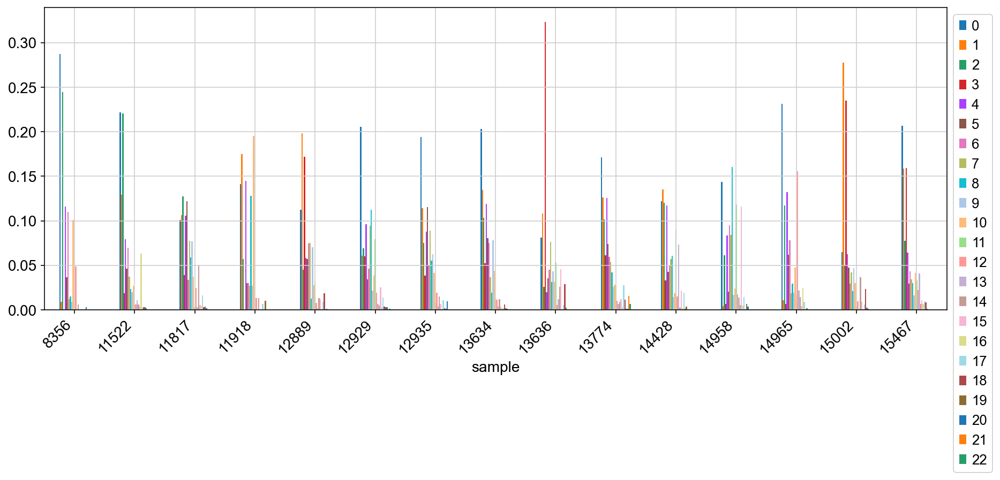

In [534]:
fig, ax = plt.subplots(figsize=(15,5))
cell_per_pat.plot.bar(ax=ax)
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.xticks(rotation=45, ha='right');

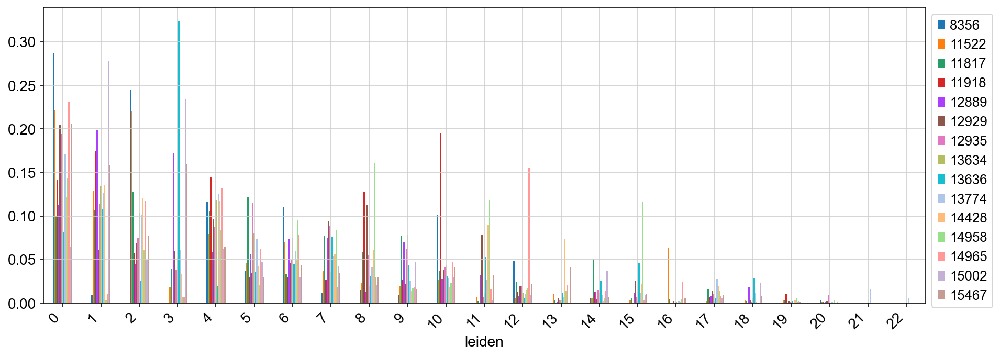

In [535]:
fig, ax = plt.subplots(figsize=(15,5))
cell_per_pat.T.plot.bar(ax=ax)
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.xticks(rotation=45, ha='right');

In [536]:
cell_per_pat_per_cell = cell_per_pat.div(cell_per_pat.sum(axis=0), axis=1)

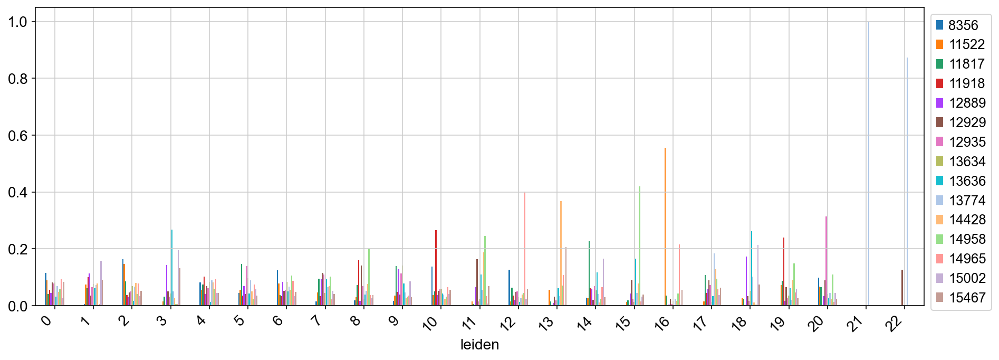

In [537]:
fig, ax = plt.subplots(figsize=(15,5))
cell_per_pat_per_cell.T.plot.bar(ax=ax)
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.xticks(rotation=45, ha='right');

In [538]:
cell_per_pat_per_cell.index = cell_per_pat_per_cell.index.astype(str)
cell_per_pat_per_cell = df_target.join(cell_per_pat_per_cell)

In [539]:
cell_per_pat_per_cell

,n_op2,0,1,2,3,4,5,6,7,8,...,13,14,15,16,17,18,19,20,21,22
pt_ID,,,,,,,,,,,,,,,,,,,,,
12929,agg,0.082517,0.034783,0.046156,0.049727,0.068188,0.041435,0.052086,0.116037,0.140837,...,0.032045,0.020530,0.092143,0.023984,0.089791,0.033323,0.064506,0.088698,0.0,0.126042
15467,agg,0.083005,0.090755,0.051866,0.132165,0.045394,0.035412,0.048729,0.041827,0.037570,...,0.206493,0.029634,0.038923,0.056094,0.063603,0.075153,0.025864,0.023709,0.0,0.000000
13634,ind,0.081770,0.077031,0.068992,0.043320,0.084114,0.096315,0.084292,0.044750,0.023962,...,0.018043,0.054261,0.013733,0.016681,0.012490,0.052147,0.034895,0.041127,0.0,0.000000
14428,int,0.048941,0.077344,0.080548,0.027378,0.082851,0.051288,0.055872,0.069823,0.075663,...,0.368733,0.010776,0.078389,0.017753,0.128092,0.011772,0.091153,0.023874,0.0,0.000000
11817,agg,0.040497,0.060844,0.085323,0.032313,0.074916,0.146337,0.037759,0.094875,0.073485,...,0.015233,0.227710,0.019466,0.035468,0.108443,0.024639,0.087445,0.065585,0.0,0.000000
14958,ind,0.057706,0.002218,0.040859,0.005632,0.059079,0.024453,0.106883,0.103064,0.200735,...,0.070886,0.024117,0.419952,0.042687,0.095888,0.004448,0.149253,0.110506,0.0,0.000000
12935,int,0.078065,0.065354,0.050160,0.032118,0.062128,0.138718,0.056461,0.109243,0.068842,...,0.018295,0.068373,0.024111,0.005325,0.071768,0.016646,0.028643,0.315083,0.0,0.000000
13636,agg,0.032688,0.061807,0.017353,0.268382,0.014092,0.042579,0.050581,0.093513,0.038943,...,0.061041,0.117322,0.166115,0.000000,0.034208,0.261832,0.061437,0.028159,0.0,0.000000
13774,agg,0.068898,0.072252,0.067979,0.050750,0.088891,0.088568,0.066769,0.065759,0.052315,...,0.034010,0.040673,0.044006,0.023757,0.183815,0.103149,0.021299,0.043930,1.0,0.873958


In [540]:
# "Melt" the dataset to "long-form" or "tidy" representation
melt_cell_per_pat_per_cell = pd.melt(cell_per_pat_per_cell, 
                                     id_vars=y_name, 
                                     value_vars=cell_per_pat_per_cell.columns[1:],
                                     var_name='cell type',
                                     value_name='proportion')
melt_cell_per_pat_per_cell.head()

,n_op2,cell type,proportion
0,agg,0,0.082517
1,agg,0,0.083005
2,ind,0,0.081770
3,int,0,0.048941
4,agg,0,0.040497


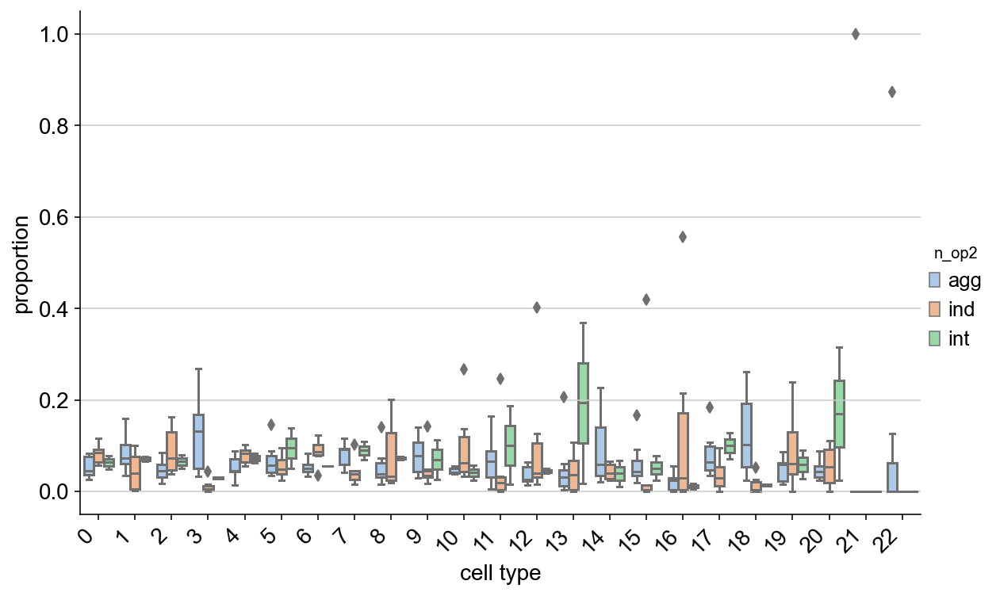

In [541]:
sns.catplot(x="cell type", y="proportion", hue=y_name,
            kind="box", palette="pastel", data=melt_cell_per_pat_per_cell,
            height=5, aspect=8/5)
plt.xticks(rotation=45, ha='right');

There are several interesting clusters, we can look at their marker genes previously defined with 3 method above. 

if I can make the CellO library work we could then have more precise cell types which proportions differ between aggressve and indolent.

try:
  - [diffxpy - Fast and scalable differential expression analysis on single-cell RNA-seq data](https://github.com/theislab/diffxpy)
  - [Triku - Feature selection for Single Cell Analysis](https://triku.readthedocs.io/en/latest/index.html)
  - [DoRothEA - Transcript Factor activity prediction](https://github.com/saezlab/dorothea-py)
  - [PROGENy - pathway activity prediction](https://github.com/saezlab/progeny-py)

Indolent vs agressive: see on UMAP, proportions in clusters, DGEA per cluster

### Stacked barplots

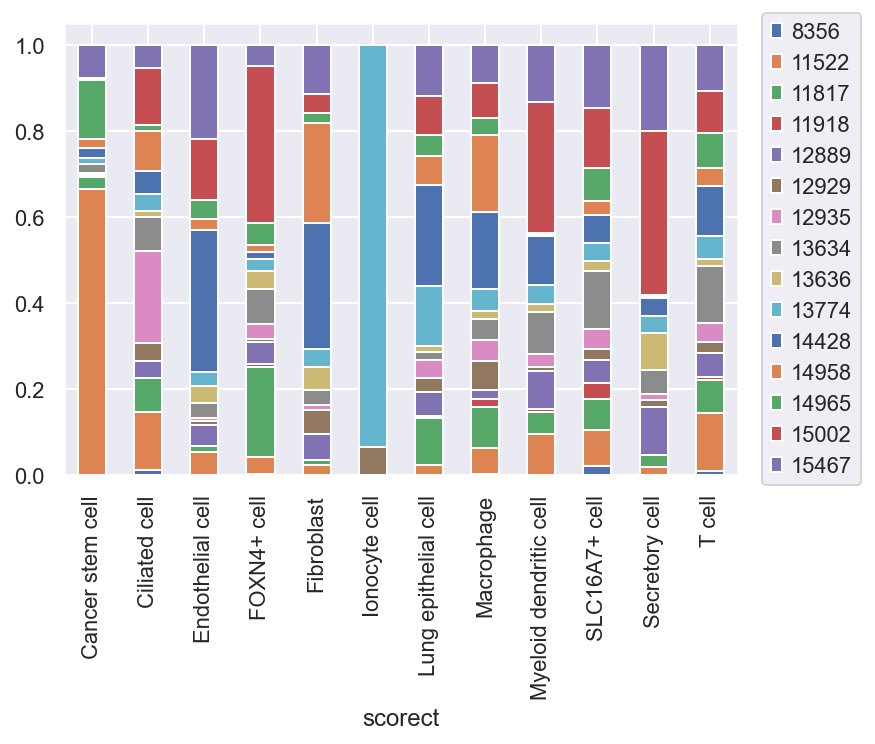

In [572]:
# by cell type colored by patient
count_mat = pd.crosstab(adata.obs['sample'], adata.obs['scorect'])
cell_per_pat = count_mat.div(count_mat.sum(axis=0), axis=1)
sns.set()
g=cell_per_pat.T.plot(kind='bar', stacked=True)
g.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))

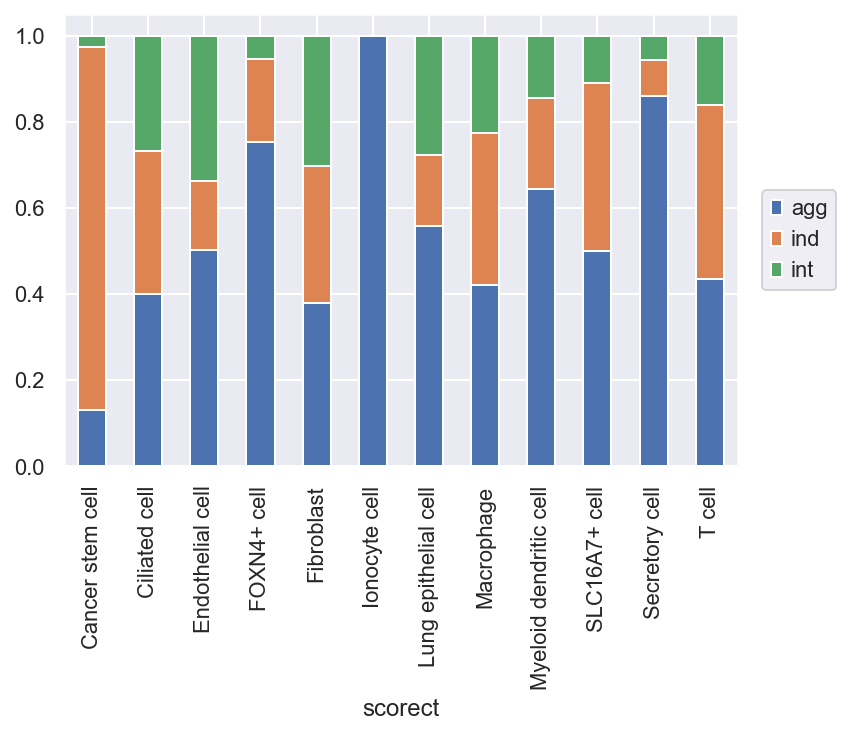

In [582]:
# by cell type colored by behavior
count_mat = pd.crosstab(adata.obs['cancer type'], adata.obs['scorect'])
cell_per_pat = count_mat.div(count_mat.sum(axis=0), axis=1)
sns.set()
g=cell_per_pat.T.plot(kind='bar', stacked=True)
g.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))

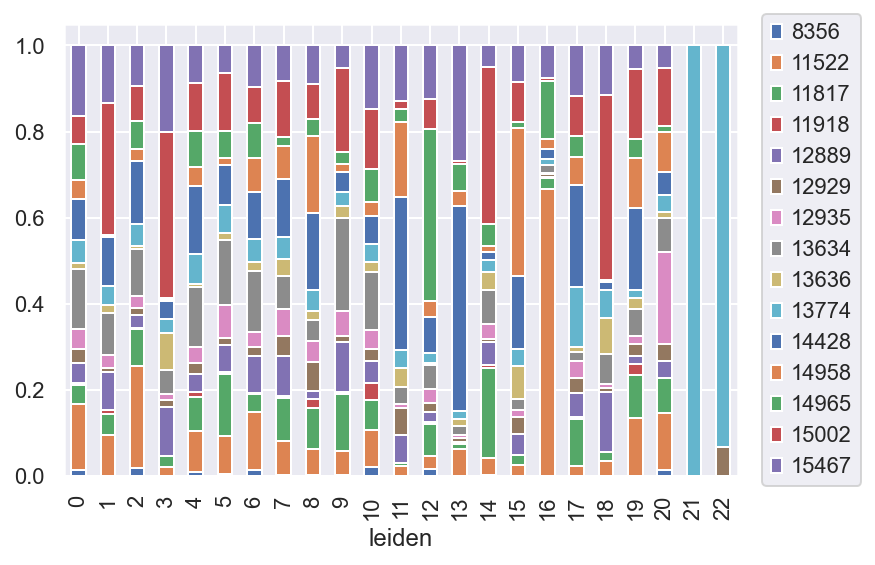

In [571]:
# by cluster
count_mat = pd.crosstab(adata.obs['sample'], adata.obs['leiden'])
cell_per_pat = count_mat.div(count_mat.sum(axis=0), axis=1)
sns.set()
g=cell_per_pat.T.plot(kind='bar', stacked=True)
g.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))

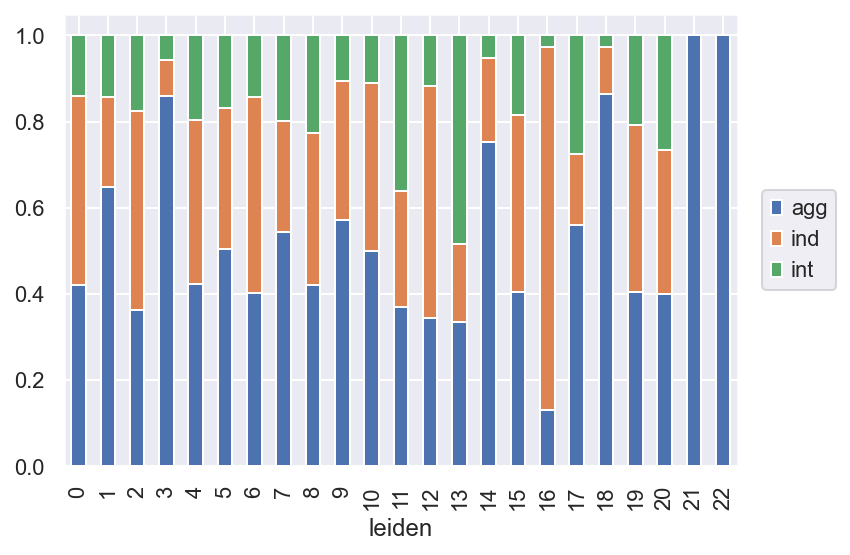

In [583]:
# by cluster colored by behavior
count_mat = pd.crosstab(adata.obs['cancer type'], adata.obs['leiden'])
cell_per_pat = count_mat.div(count_mat.sum(axis=0), axis=1)
sns.set()
g=cell_per_pat.T.plot(kind='bar', stacked=True)
g.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))

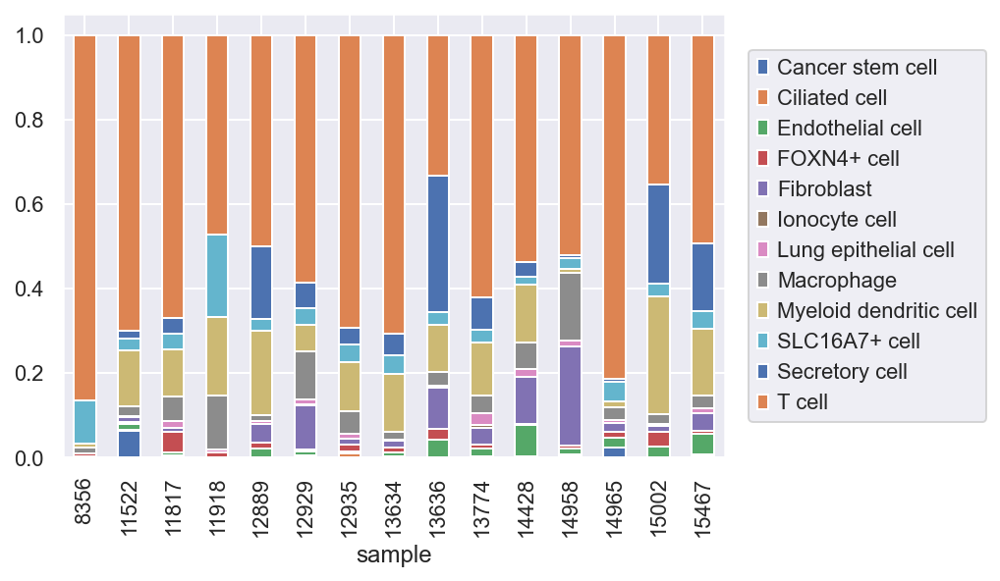

In [574]:
# by patient colored by cell type
count_mat = pd.crosstab(adata.obs['sample'], adata.obs['scorect'])
cell_per_pat = count_mat.div(count_mat.sum(axis=1), axis=0)
sns.set()
g=cell_per_pat.plot(kind='bar', stacked=True)
g.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))

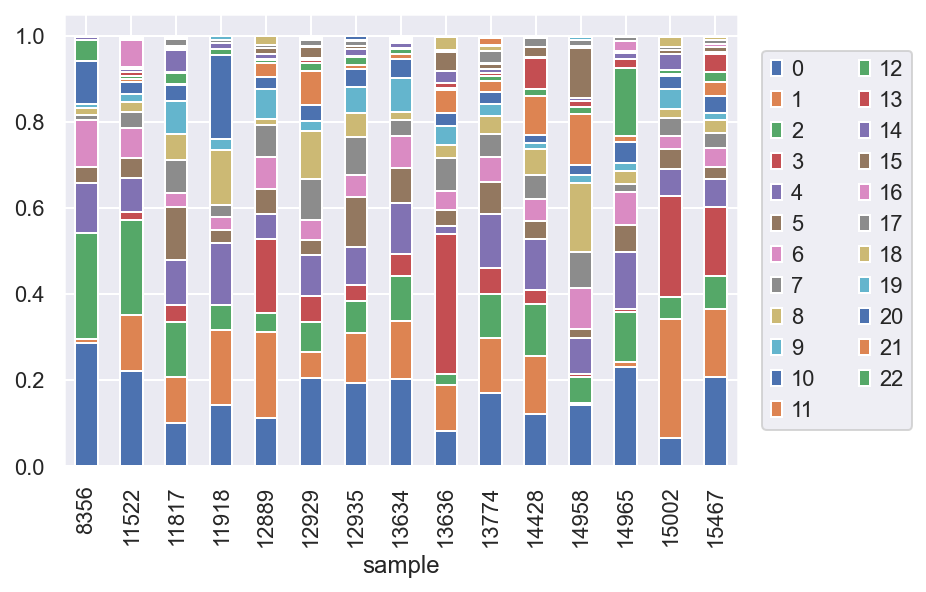

In [577]:
# by patient colored by cluster
count_mat = pd.crosstab(adata.obs['sample'], adata.obs['leiden'])
cell_per_pat = count_mat.div(count_mat.sum(axis=1), axis=0)
sns.set()
g=cell_per_pat.plot(kind='bar', stacked=True)
g.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), ncol=2)
g.yaxis.set_major_formatter(PercentFormatter(1))

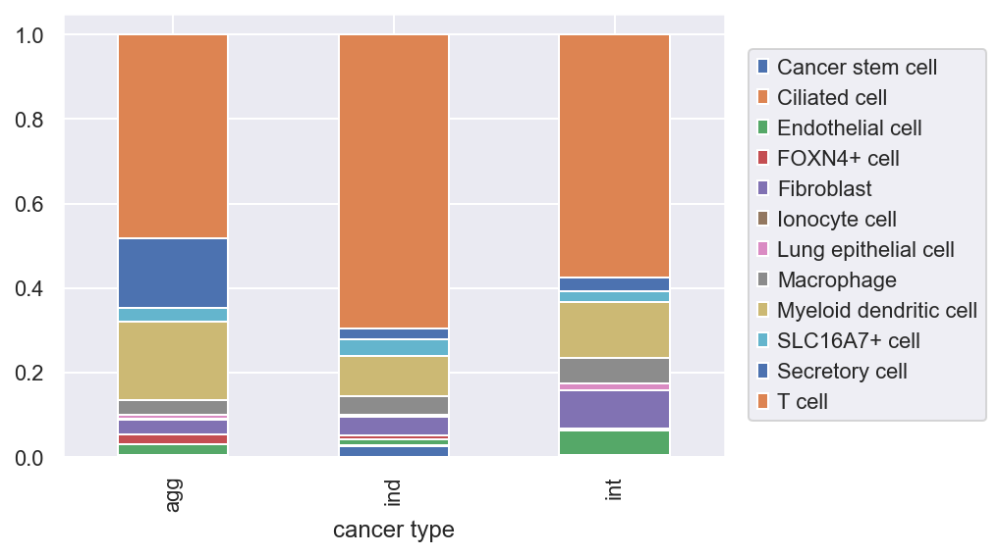

In [578]:
# by behavior colored by cell type
count_mat = pd.crosstab(adata.obs['cancer type'], adata.obs['scorect'])
cell_per_pat = count_mat.div(count_mat.sum(axis=1), axis=0)
sns.set()
g=cell_per_pat.plot(kind='bar', stacked=True)
g.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))

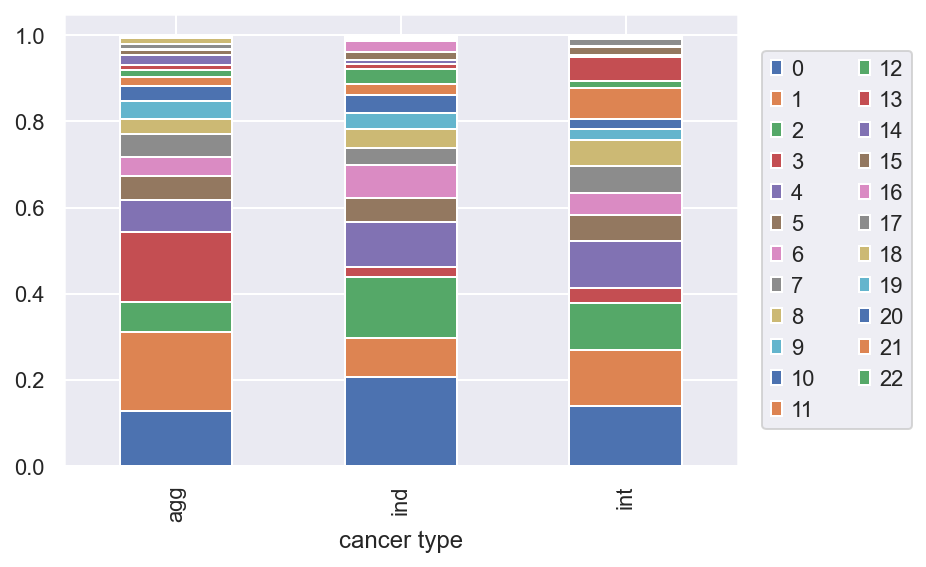

In [581]:
# by behavior colored by cell type
count_mat = pd.crosstab(adata.obs['cancer type'], adata.obs['leiden'])
cell_per_pat = count_mat.div(count_mat.sum(axis=1), axis=0)
sns.set()
g=cell_per_pat.plot(kind='bar', stacked=True)
g.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), ncol=2)